<a href="https://colab.research.google.com/github/Reem00000/ImageOpCvIntro/blob/main/PRT565Lect1and2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ipywidgets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 5.1 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output


In [ ]:
learning_rate_slider = widgets.FloatSlider(
    value=0.01, min=0.001, max=0.11, step=0.001, description='Learning Rate:'
)
epochs_slider = widgets.IntSlider(
    value=1000, min=10, max=3000, step=100, description='Epochs:'
)
run_button = widgets.Button(description="Train Model", button_style='success')

display(learning_rate_slider, epochs_slider, run_button)


FloatSlider(value=0.01, description='Learning Rate:', max=0.11, min=0.001, step=0.001)

IntSlider(value=1000, description='Epochs:', max=3000, min=10, step=100)

Button(button_style='success', description='Train Model', style=ButtonStyle())

**Example for predicting house Prices based on Distance**

![Picture2.png



In [ ]:
def train_model(learning_rate, epochs):
    # Training data
    x_train = [1, 2, 3, 4, 5]
    y_train = [550, 450, 350, 250, 150]

    weight = 0.0
    bias = 0.0
    loss_history = []

    for epoch in range(epochs):
        total_loss = 0
        for i in range(len(x_train)):
            y_pred = weight * x_train[i] + bias
            error = y_pred - y_train[i]
            loss = error ** 2
            total_loss += loss
            dW = 2 * error * x_train[i]
            dB = 2 * error
            weight -= learning_rate * dW
            bias -= learning_rate * dB
            if i==0 and epoch==0:
              print(" initial : d w", dW , "dB", dB)

        loss_history.append(total_loss)

    # Show final model
    print(f"Final Weight: {weight:.2f}, Bias: {bias:.2f}, Loss: {total_loss:.2f}")

    # Plot training loss
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    ax[0].plot(loss_history)
    ax[0].set_title("Training Loss")
    ax[0].set_xlabel("Epoch")
    ax[0].set_ylabel("Total Loss")
    ax[0].grid(True)

    # Plot regression line
    ax[1].scatter(x_train, y_train, color="blue", label="Actual data")
    y_pred_line = [weight * x + bias for x in x_train]
    ax[1].plot(x_train, y_pred_line, color="red", label="Learned line")
    ax[1].set_title("Linear Regression Fit")
    ax[1].set_xlabel("Size (100s sqft)")
    ax[1].set_ylabel("Price ($1000s)")
    ax[1].legend()
    ax[1].grid(True)

    plt.tight_layout()
    plt.show()

    return weight, bias


In [ ]:
def on_button_clicked(b):
    clear_output(wait=True)
    display(learning_rate_slider, epochs_slider, run_button)

    # Train and get the final weight and bias
    weight, bias = train_model(learning_rate_slider.value, epochs_slider.value)

    # Create a text box to input new x value
    x_input = widgets.FloatText(description="Enter x:")
    predict_button = widgets.Button(description="Predict Price")

    output = widgets.Output()

    def on_predict_clicked(_):
        with output:
            clear_output()
            x_val = x_input.value
            y_pred = weight * x_val + bias
            print(f"Predicted price for size {x_val}00 sqft = ${y_pred:.2f}K")

    predict_button.on_click(on_predict_clicked)

    display(widgets.HBox([x_input, predict_button]), output)

run_button.on_click(on_button_clicked)


**Real-World Scenario: Apartment Price vs. Train Station Distance**

Suppose you're classifying whether an apartment is over priced or not, based on:

*  Feature 1: x1: Distance from the nearest train station (in km)
*  Feature 2: x2: Size of the apartment (in square meters)

The output label (y) will be:

*   +1: Expensive apartment
*   -1: Affordable apartment

depending on the price per meter square so that the client doesn't pay more than $50 /m^2



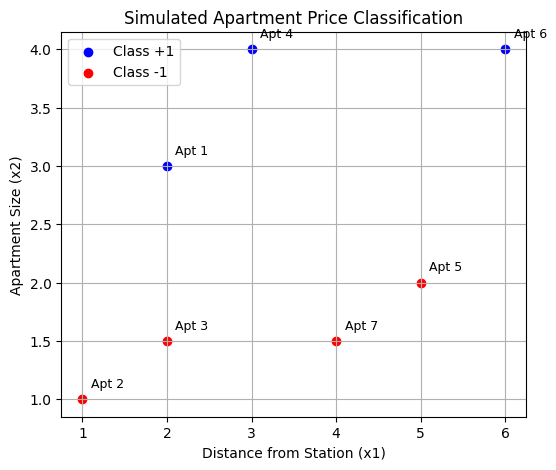

In [ ]:
import numpy as np

# Let's regenerate the dataset to have the same number of labels as shown in the Week 2 slides
# The Week 2 slide (ADALINE – Adaptive Linear Neuron) has 7 labeled data points: 3 with +1, 4 with -1

# Defining dataset
X_extended = np.array([
    [2, 3],   # +1
    [1, 1],   # -1
    [2, 1.5], # -1
    [3, 4],   # +1
    [5, 2],   # -1
    [6, 4],   # +1
    [4, 1.5]  # -1
])
prices=np.array([700, 360, 420, 665, 390, 770, 330])
# Reinforcing the use of realistic thresholds and business logic
threshold_price = 650  # threshold in $K

# Convert prices to labels: 1 if overpriced (above threshold), -1 otherwise
y_extended = np.where(prices > threshold_price, 1, -1)

# plot the dataset with apartment numbers as labels
plt.figure(figsize=(6, 5))
for i in range(len(X_extended)):
    color = 'blue' if y_extended[i] == 1 else 'red'
    plt.scatter(X_extended[i, 0], X_extended[i, 1], color=color,
                label='Class +1' if y_extended[i] == 1 and i == 0 else ('Class -1' if y_extended[i] == -1 and i == 1 else ""))
    plt.text(X_extended[i, 0] + 0.1, X_extended[i, 1] + 0.1, f"Apt {i+1}", fontsize=9)

plt.xlabel("Distance from Station (x1)")
plt.ylabel("Apartment Size (x2)")
plt.title("Simulated Apartment Price Classification")
plt.legend()
plt.grid(True)
plt.show()



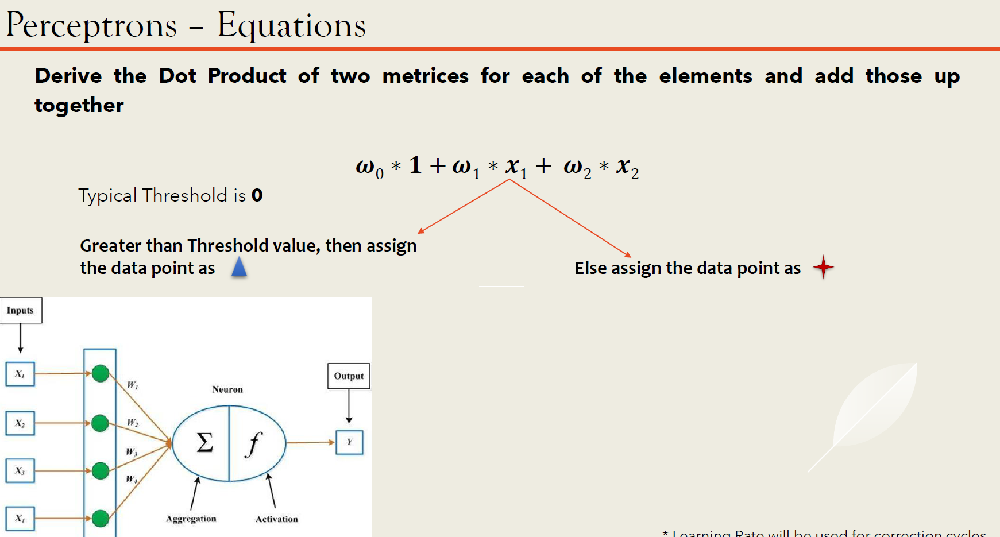

In [ ]:

#Perceptron
class Perceptron:
    def __init__(self, learning_rate=0.01, epochs=10):
        self.lr = learning_rate
        self.epochs = epochs
# 𝜼 = Learning Rate: how fast the Perceptron converges to an optimal divider, involves tradeoffs
# epochs refers to how many times the model loops through all data points.
    def fit(self, X, y):
        self.weights = np.zeros(1 + X.shape[1])
        self.errors = []
        # Weight Update Logic

        for _ in range(self.epochs):
            error_count = 0
            for xi, target in zip(X, y):
                update = self.lr * (target - self.predict(xi))
                self.weights[1:] += update * xi
                self.weights[0] += update
                error_count += int(update != 0.0)
            self.errors.append(error_count)
        return self

    def net_input(self, X):
        return np.dot(X, self.weights[1:]) + self.weights[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)



In [ ]:
# Modify Perceptron class to include weight history for visualization
class Perceptron:
    def __init__(self, learning_rate=0.01, epochs=10):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []  # Store weights for each epoch
        self.errors = []

    def fit(self, X, y):
        self.weights = np.zeros(1 + X.shape[1])
        self.errors = []
        self.weight_history.append(self.weights.copy())

        for _ in range(self.epochs):
            error_count = 0
            for xi, target in zip(X, y):
                update = self.lr * (target - self.predict(xi))
                self.weights[1:] += update * xi
                self.weights[0] += update
                error_count += int(update != 0.0)
            self.errors.append(error_count)
            self.weight_history.append(self.weights.copy())
        return self

    def net_input(self, X):
        return np.dot(X, self.weights[1:]) + self.weights[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)

In Perceptron (and Adaline), the decision boundary is where the model is undecided — that is, where the net input equals zero:

𝜔
0
+
𝜔
1
𝑥
1
+
𝜔
2
𝑥
2
=
0
ω
0
​
 +ω
1
​
 x
1
​
 +ω
2
​
 x
2
​
 =0
This is the equation of a line in 2D (since we have two input features:
𝑥
1
x
1
​
  = distance,
𝑥
2
x
2
​
  = size).

🎯 Goal: Solve for
𝑥
2
x
2
​
  to Plot the Line
To draw this line in Python (with x1 on the x-axis and x2 on the y-axis), we rearrange the equation:

𝜔
2
𝑥
2
=
−
(
𝜔
0
+
𝜔
1
𝑥
1
)
ω
2
​
 x
2
​
 =−(ω
0
​
 +ω
1
​
 x
1
​
 )
𝑥
2
=
−
𝜔
0
+
𝜔
1
𝑥
1
𝜔
2
x
2
​
 =−
ω
2
​

ω
0
​
 +ω
1
​
 x
1
​

​



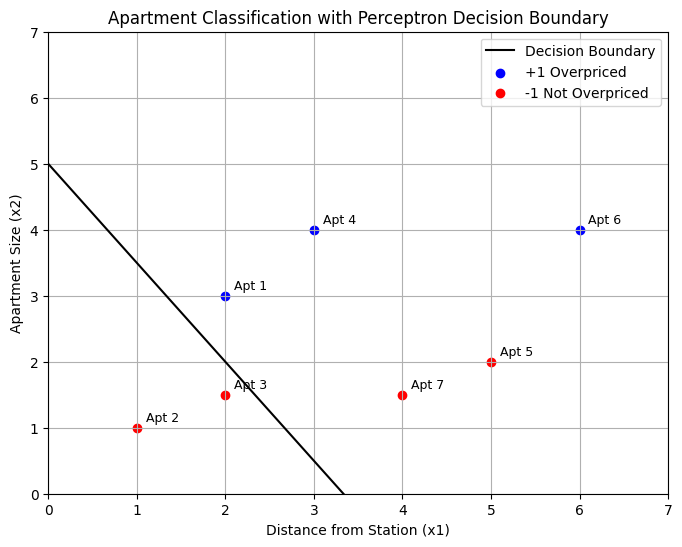

In [ ]:

# # Labels: +1 for overpriced, -1 for not overpriced
# y_extended = np.where(prices > threshold_price, 1, -1)

# Reuse weights
weights = np.array([-4.0, 1.2, 0.8])  # [bias, w1, w2]

# Plot all apartments with true labels and decision boundary
def plot_full_classification_with_boundary(X, y, weights):
    x_vals = np.linspace(0, 7, 100)
    y_vals = -(weights[0] + weights[1] * x_vals) / weights[2]

    plt.figure(figsize=(8, 6))
    plt.plot(x_vals, y_vals, label='Decision Boundary', color='black')

    # Plot all apartments with class color
    for i, (x, label) in enumerate(zip(X, y)):
        color = 'blue' if label == 1 else 'red'
        plt.scatter(x[0], x[1], color=color)
        plt.text(x[0] + 0.1, x[1] + 0.1, f"Apt {i+1}", fontsize=9)

    plt.xlim(0, 7)
    plt.ylim(0, 7)
    plt.xlabel("Distance from Station (x1)")
    plt.ylabel("Apartment Size (x2)")
    plt.title("Apartment Classification with Perceptron Decision Boundary")
    plt.legend(["Decision Boundary", "+1 Overpriced", "-1 Not Overpriced"])
    plt.grid(True)
    plt.show()

# Plot it
plot_full_classification_with_boundary(X_extended, y_extended, weights)

In Perceptron (and Adaline), the decision boundary is where the model is undecided — that is, where the net input equals zero:

𝜔
0
+
𝜔
1
𝑥
1
+
𝜔
2
𝑥
2
=
0


This is the equation of a line in 2D (since we have two input features:
𝑥
1
  = distance,
𝑥
2
  = size).

**Goal:** Solve for
𝑥2 to Plot the Line


To draw this line in Python (with x1 on the x-axis and x2 on the y-axis), we rearrange the equation:

𝜔
2
𝑥
2
=
−
(
𝜔
0
+
𝜔
1
𝑥
1
)


𝑥
2
=
−(
𝜔
0
+
𝜔
1
𝑥
1)/
𝜔
2

Then Bias = -𝜔0/𝜔2 and slope = -𝜔1/𝜔2


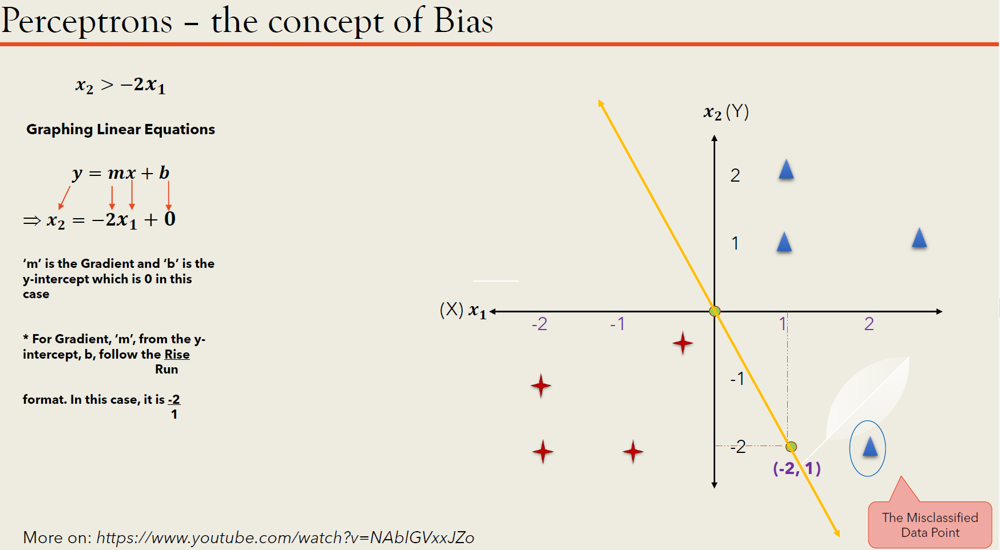

In [ ]:
# Re-define the example weights
weights = np.array([-4.0, 1.2, 0.8])  # [bias, w1, w2]

# Extract weights
bias = weights[0]
w1 = weights[1]
w2 = weights[2]

# Compute slope and intercept
slope = -w1 / w2
intercept = -bias / w2

# Recalculate bias from intercept and w2 to show relationship
bias_from_intercept = -intercept * w2

{
    "Original Bias": bias,
    "Weight 1 (w1)": w1,
    "Weight 2 (w2)": w2,
    "Slope": slope,
    "Y-Intercept": intercept,
    "Bias Recomputed from Intercept and w2": bias_from_intercept
}


{'Original Bias': np.float64(-4.0),
 'Weight 1 (w1)': np.float64(1.2),
 'Weight 2 (w2)': np.float64(0.8),
 'Slope': np.float64(-1.4999999999999998),
 'Y-Intercept': np.float64(5.0),
 'Bias Recomputed from Intercept and w2': np.float64(-4.0)}

In [ ]:


# Define two examples from earlier dataset
example_1 = np.array([2, 3])  # Apartment 1
example_2 = np.array([5, 2])  # Apartment 5

# Simulated weights: bias = -4, w1 = 1.2 (distance), w2 = 0.8 (size)
weights = np.array([-4.0, 1.2, 0.8])  # [bias, weight1, weight2]

# Function to compute net input and binary prediction
def perceptron_predict(x, weights):
    net_input = weights[0] + np.dot(weights[1:], x)
    prediction = 1 if net_input >= 0 else -1
    return net_input, prediction

# Apply to both apartments
net_1, pred_1 = perceptron_predict(example_1, weights)
net_2, pred_2 = perceptron_predict(example_2, weights)

(net_1, pred_1), (net_2, pred_2)


((np.float64(0.8000000000000007), 1), (np.float64(3.5999999999999996), 1))

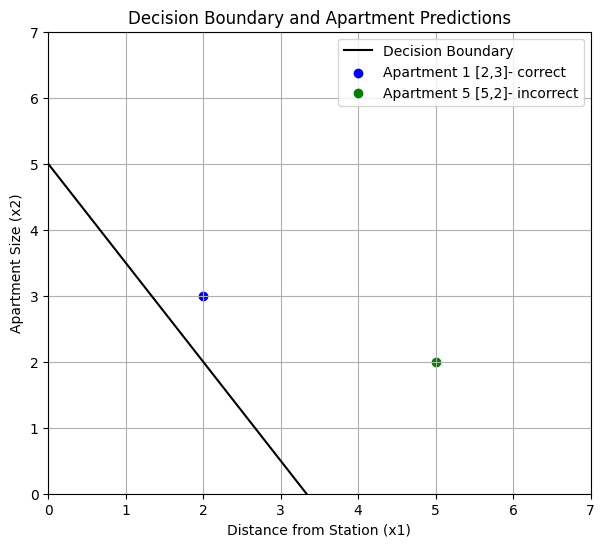

{'Apartment 1': {'Input': [2, 3],
  'Net Input': np.float64(0.8000000000000007),
  'Prediction': 1,
  'Actual': 1},
 'Apartment 5': {'Input': [5, 2],
  'Net Input': np.float64(3.5999999999999996),
  'Prediction': 1,
  'Actual': -1},
 'Decision Line Equation': 'x2 = -1.50 * x1 + 5.00'}

In [ ]:
# Re-define example apartments
example_1 = np.array([2, 3])  # Apartment 1
example_2 = np.array([5, 2])  # Apartment 5

# Define weights (Initial Values)
weights = np.array([-4.0, 1.2, 0.8])  # [bias, w1, w2]

# Compute slope and intercept for decision boundary
slope = -weights[1] / weights[2]
intercept = -weights[0] / weights[2]

# Plot the decision boundary using slope and intercept
x_vals = np.linspace(0, 7, 100)
y_vals = slope * x_vals + intercept

plt.figure(figsize=(7, 6))
plt.plot(x_vals, y_vals, color='black', label='Decision Boundary')

# Plot example apartments
plt.scatter(example_1[0], example_1[1], color='blue', label='Apartment 1 [2,3]- correct')
plt.scatter(example_2[0], example_2[1], color='green', label='Apartment 5 [5,2]- incorrect')

plt.xlim(0, 7)
plt.ylim(0, 7)
plt.xlabel("Distance from Station (x1)")
plt.ylabel("Apartment Size (x2)")
plt.title("Decision Boundary and Apartment Predictions")
plt.legend()
plt.grid(True)
plt.show()

# Re-define the prediction function
def perceptron_predict(x, weights):
    net_input = weights[0] + np.dot(weights[1:], x)
    prediction = 1 if net_input >= 0 else -1
    return net_input, prediction

# Apply to both apartments
net_1, pred_1 = perceptron_predict(example_1, weights)
net_2, pred_2 = perceptron_predict(example_2, weights)

{
    "Apartment 1": {"Input": example_1.tolist(), "Net Input": net_1, "Prediction": pred_1, "Actual":+1},
    "Apartment 5": {"Input": example_2.tolist(), "Net Input": net_2, "Prediction": pred_2,"Actual":-1 },
    "Decision Line Equation": f"x2 = {slope:.2f} * x1 + {intercept:.2f}"
}


**Perceptron Decision Making — Step-by-Step Explanation**

We use the trained Perceptron weights:


weights = [-4.0, 1.2, 0.8]  # [bias, weight for distance, weight for size]
The Perceptron makes predictions using the rule:


net_input = bias + w1 * x1 + w2 * x2
prediction = +1 if net_input >= 0 else -1

Example 1: Apartment [2, 3]
Distance from station: 2 km,
Size: 3 m²

**Calculation:**

net_input = -4 + (1.2 * 2) + (0.8 * 3) = -4 + 2.4 + 2.4 = 0.8
Prediction:

Since 0.8 >= 0 → Predicted Class = +1 (Overpriced)
Example 2: Apartment [5, 2]
Distance: 5 km,
Size: 2 m²

Calculation:

net_input = -4 + (1.2 * 5) + (0.8 * 2) = -4 + 6 + 1.6 = 3.6
Prediction:

Since 3.6 >= 0 → Predicted Class = +1 (Overpriced)
Summary of the Threshold Logic
Net Input	Prediction
≥ 0	Class +1 (Overpriced)
< 0	Class -1 (Not overpriced)

Perceptron:

"𝜔₀ + 𝜔₁x₁ + 𝜔₂x₂ > 0 → Class +1"

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image
from matplotlib import rc



# Create and initialize model with custom weights
model = Perceptron(learning_rate=0.01, epochs=25)
model.weights = np.array([-4.0, 1.2, 0.8])  # bias, w1, w2 (INITIAL CUSTOM WEIGHTS)
model.weight_history = [model.weights.copy()]  # record starting point

# Manually perform fit() loop (so we don’t override initial weights)
for _ in range(model.epochs):
    error_count = 0
    for xi, target in zip(X_extended, y_extended):
        update = model.lr * (target - model.predict(xi))
        model.weights[1:] += update * xi
        model.weights[0] += update
        error_count += int(update != 0.0)
    model.errors.append(error_count)
    model.weight_history.append(model.weights.copy())

# Create animation
fig, ax = plt.subplots(figsize=(8, 6))
x_vals = np.linspace(0, 7, 100)

def update(epoch):
    ax.clear()
    weights = model.weight_history[epoch]
    slope = -weights[1] / weights[2] if weights[2] != 0 else 0
    intercept = -weights[0] / weights[2] if weights[2] != 0 else 0
    y_vals = slope * x_vals + intercept

    ax.plot(x_vals, y_vals, 'k-', label='Decision Boundary')
    ax.scatter(X_extended[:, 0], X_extended[:, 1],
               c=['blue' if y == 1 else 'red' for y in y_extended])
    for i, (x, y) in enumerate(X_extended):
        ax.text(x + 0.1, y + 0.1, f"Apt {i+1}", fontsize=9)
    ax.set_xlim(0, 7)
    ax.set_ylim(0, 7)
    ax.set_xlabel("Distance from Station (x1)")
    ax.set_ylabel("Apartment Size (x2)")
    ax.set_title(f"Epoch {epoch} - Weights: {weights.round(2)}")
    ax.grid(True)

ani = animation.FuncAnimation(fig, update, frames=len(model.weight_history), interval=1000, repeat=False)

# Save animation as GIF
ani.save("perceptron_animation.gif", writer='pillow')

# Display the GIF in the notebook
Image("perceptron_animation.gif")


AttributeError: 'Perceptron' object has no attribute 'errors'

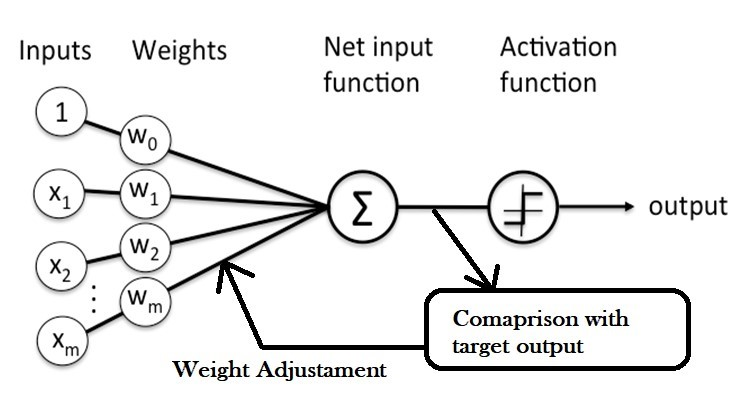

**Key Differences Between Perceptron and ADALINE**

•	The Perceptron uses the class labels to learn model coefficients

•	Adaline uses continuous predicted values (from the net input) to learn the model coefficients, which is more “powerful” since it tells us by “how much” we were right or wrong

Since the ADALINE learns all the timeand the Perceptron only after errors, the ADALINE will find a solution faster than the Perceptron for the same problem




In [ ]:

class AdalineGD:
    def __init__(self, learning_rate=0.01, epochs=10):
        self.lr = learning_rate
        self.epochs = epochs

    def fit(self, X, y):
        self.weights = np.zeros(1 + X.shape[1])
        self.cost = []

        for _ in range(self.epochs):
            net_input = self.net_input(X)
            errors = y - net_input
            self.weights[1:] += self.lr * X.T.dot(errors)
            self.weights[0] += self.lr * errors.sum()
            cost = (errors ** 2).sum() / 2.0
            self.cost.append(cost)
        return self

    def net_input(self, X):
        return np.dot(X, self.weights[1:]) + self.weights[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)



**Gradient Descent** is an optimization algorithm for finding a local minimum of a function Gradient descent is simply used
in machine learning to find the values of a function's parameters ( that minimize a cost function as far as
possible A gradient ( simply measures the change in all weights with regard to the change in error

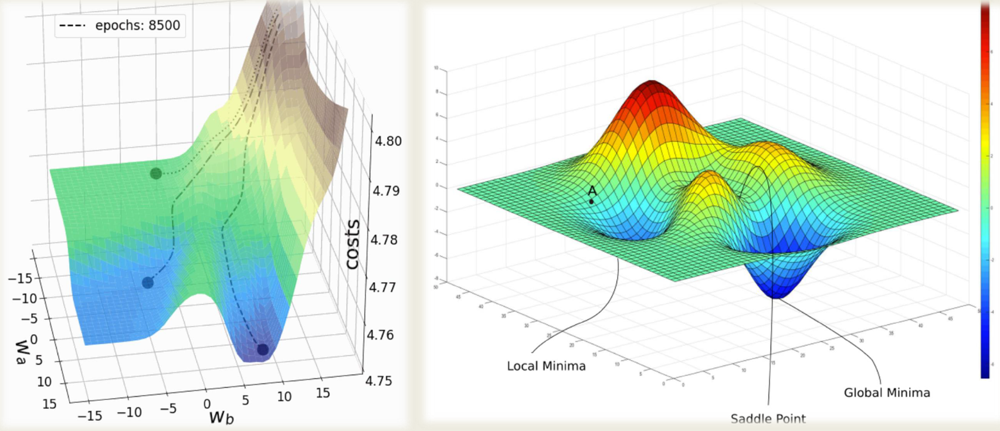

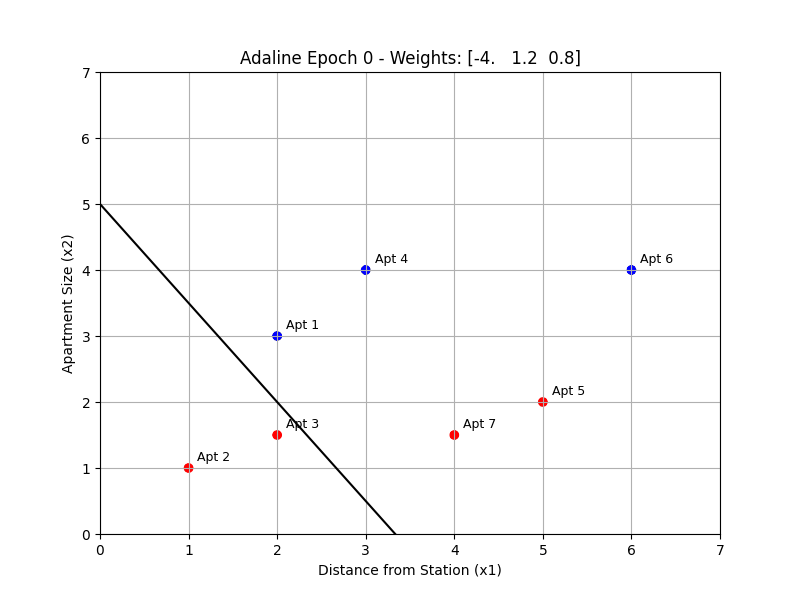

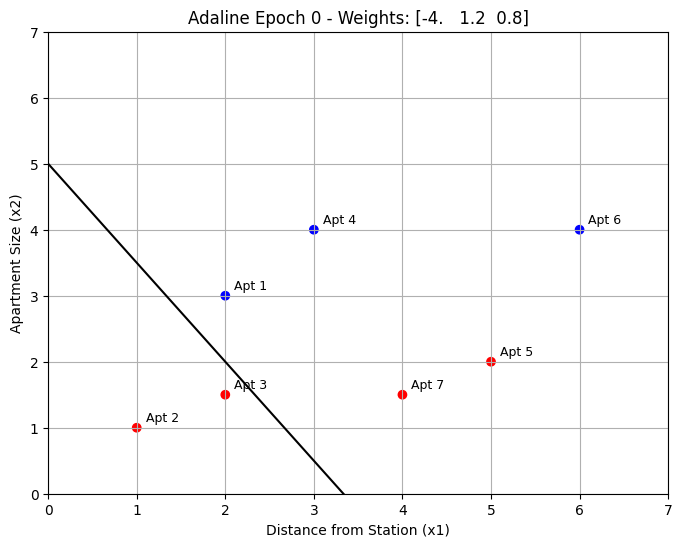

In [ ]:
#Updated AdalineGD class to track weight history for visualization
class AdalineGD:
    def __init__(self, learning_rate=0.01, epochs=25):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []
        self.cost = []

    def net_input(self, X):
        return np.dot(X, self.weights[1:]) + self.weights[0]

    def predict(self, X):
        return np.where(self.net_input(X) >= 0.0, 1, -1)

    def fit(self, X, y):
      self.weights = np.zeros(1 + X.shape[1])
      self.weight_history = [self.weights.copy()]
      self.cost = []

      for _ in range(self.epochs):
          net_input = self.net_input(X)
          errors = y - net_input
          self.weights[1:] += self.lr * X.T.dot(errors)
          self.weights[0] += self.lr * errors.sum()
          self.weight_history.append(self.weights.copy())
          cost = (errors ** 2).sum() / 2.0
          self.cost.append(cost)
      return self

# Dataset reused
X_extended = np.array([
    [2, 3], [1, 1], [2, 1.5], [3, 4], [5, 2], [6, 4], [4, 1.5]
])
prices = np.array([700., 360., 420., 665., 390., 770., 330.])
threshold_price = 650
y_extended = np.where(prices > threshold_price, 1, -1)

# Create and initialize Adaline with custom weights
adaline = AdalineGD(learning_rate=0.01, epochs=25)
adaline.weights = np.array([-4.0, 1.2, 0.8])  # custom start
adaline.weight_history = [adaline.weights.copy()]  # store initial weights

# Manual training loop to apply gradient descent and store weights
for _ in range(adaline.epochs):
    net_input = adaline.net_input(X_extended)
    errors = y_extended - net_input
    adaline.weights[1:] += adaline.lr * X_extended.T.dot(errors)
    adaline.weights[0] += adaline.lr * errors.sum()
    adaline.weight_history.append(adaline.weights.copy())
    cost = (errors ** 2).sum() / 2.0
    adaline.cost.append(cost)

# Create animation of gradient descent
fig, ax = plt.subplots(figsize=(8, 6))
x_vals = np.linspace(0, 7, 100)

def update_adaline(epoch):
    ax.clear()
    weights = adaline.weight_history[epoch]
    slope = -weights[1] / weights[2] if weights[2] != 0 else 0
    intercept = -weights[0] / weights[2] if weights[2] != 0 else 0
    y_vals = slope * x_vals + intercept

    ax.plot(x_vals, y_vals, 'k-', label='Decision Boundary')
    ax.scatter(X_extended[:, 0], X_extended[:, 1],
               c=['blue' if y == 1 else 'red' for y in y_extended])
    for i, (x, y) in enumerate(X_extended):
        ax.text(x + 0.1, y + 0.1, f"Apt {i+1}", fontsize=9)
    ax.set_xlim(0, 7)
    ax.set_ylim(0, 7)
    ax.set_xlabel("Distance from Station (x1)")
    ax.set_ylabel("Apartment Size (x2)")
    ax.set_title(f"Adaline Epoch {epoch} - Weights: {weights.round(2)}")
    ax.grid(True)

ani_adaline = animation.FuncAnimation(fig, update_adaline, frames=len(adaline.weight_history), interval=1000, repeat=False)

# Save and display the animation
ani_adaline.save("adaline_animation.gif", writer='pillow')
Image("adaline_animation.gif")


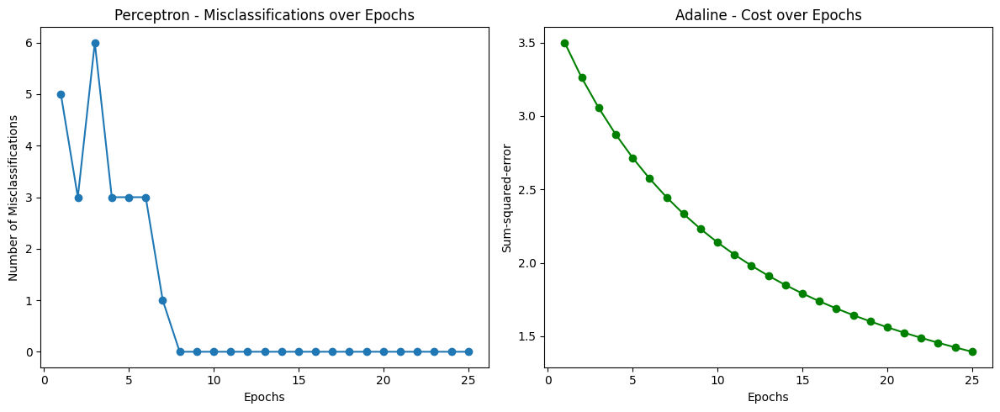

In [ ]:
 #Train Perceptron model
ppn = Perceptron(learning_rate=0.01, epochs=25)
ppn.fit(X_extended, y_extended)
# Train Adaline model

ada = AdalineGD(learning_rate=0.01, epochs=25)
ada.fit(X_extended, y_extended)


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(ppn.errors) + 1), ppn.errors, marker='o')
plt.title('Perceptron - Misclassifications over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Number of Misclassifications')

plt.subplot(1, 2, 2)
plt.plot(range(1, len(ada.cost) + 1), ada.cost, marker='o', color='green')
plt.title('Adaline - Cost over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Sum-squared-error')

plt.tight_layout()
plt.show()

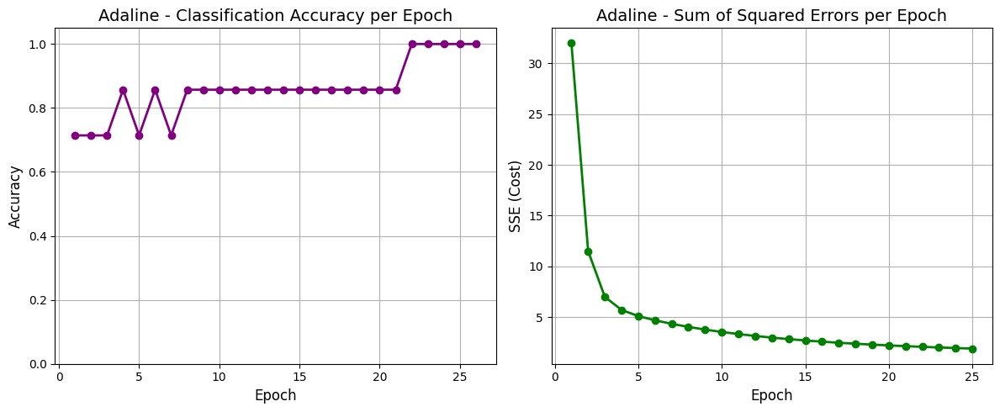

In [ ]:

# Compute accuracy per epoch
adaline_accuracies = []
for weights in adaline.weight_history:
    net_input = np.dot(X_extended, weights[1:]) + weights[0]
    predictions = np.where(net_input >= 0.0, 1, -1)
    accuracy = np.mean(predictions == y_extended)
    adaline_accuracies.append(accuracy)
# Improve the side-by-side plot: accuracy and cost for Adaline
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(range(1, len(adaline_accuracies) + 1), adaline_accuracies, marker='o', color='purple', linewidth=2)
plt.title("Adaline - Classification Accuracy per Epoch", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.ylim(0, 1.05)
plt.grid(True)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Plot cost
plt.subplot(1, 2, 2)
plt.plot(range(1, len(adaline.cost) + 1), adaline.cost, marker='o', color='green', linewidth=2)
plt.title("Adaline - Sum of Squared Errors per Epoch", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("SSE (Cost)", fontsize=12)
plt.grid(True)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()



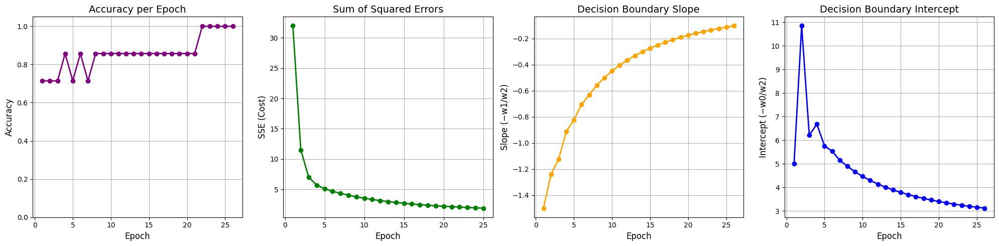

In [ ]:
# Calculate intercept = -w0 / w2 for each epoch
# Calculate slope = -w1 / w2 for each epoch

adaline_intercepts = []
adaline_slopes = []

for weights in adaline.weight_history:
    intercept = -weights[0] / weights[2] if weights[2] != 0 else 0
    adaline_intercepts.append(intercept)
    slope = -weights[1] / weights[2] if weights[2] != 0 else 0
    adaline_slopes.append(slope)

# Plot accuracy, cost, slope, and intercept
plt.figure(figsize=(20, 5))

# Accuracy plot
plt.subplot(1, 4, 1)
plt.plot(range(1, len(adaline_accuracies) + 1), adaline_accuracies, marker='o', color='purple', linewidth=2)
plt.title("Accuracy per Epoch", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.ylim(0, 1.05)
plt.grid(True)

# Cost plot
plt.subplot(1, 4, 2)
plt.plot(range(1, len(adaline.cost) + 1), adaline.cost, marker='o', color='green', linewidth=2)
plt.title("Sum of Squared Errors", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("SSE (Cost)", fontsize=12)
plt.grid(True)

# Slope plot
plt.subplot(1, 4, 3)
plt.plot(range(1, len(adaline_slopes) + 1), adaline_slopes, marker='o', color='orange', linewidth=2)
plt.title("Decision Boundary Slope", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Slope (−w1/w2)", fontsize=12)
plt.grid(True)

# Intercept plot
plt.subplot(1, 4, 4)
plt.plot(range(1, len(adaline_intercepts) + 1), adaline_intercepts, marker='o', color='blue', linewidth=2)
plt.title("Decision Boundary Intercept", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Intercept (−w0/w2)", fontsize=12)
plt.grid(True)

plt.tight_layout()
plt.show()


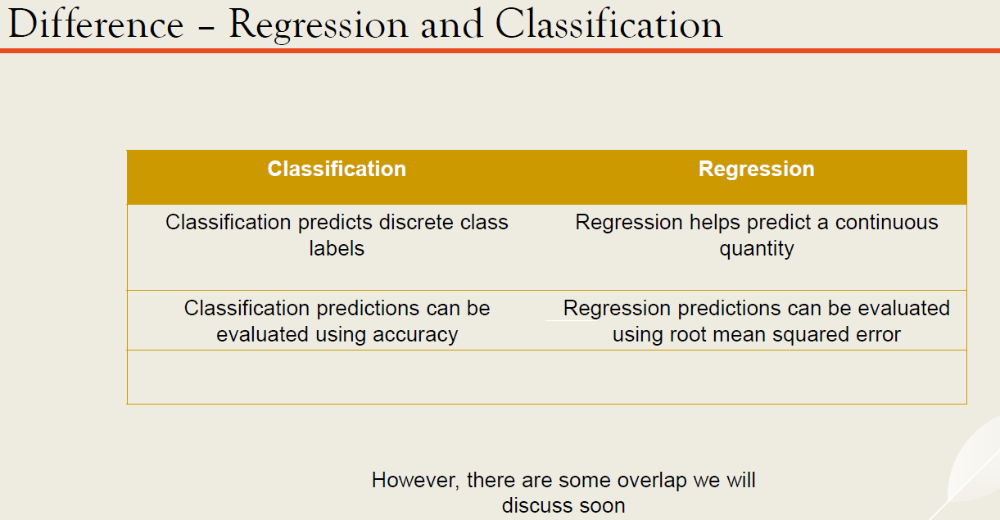

Blue: Overpriced
Red: Not Overpriced

/tmp/ipython-input-367154571.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_clf.legend()


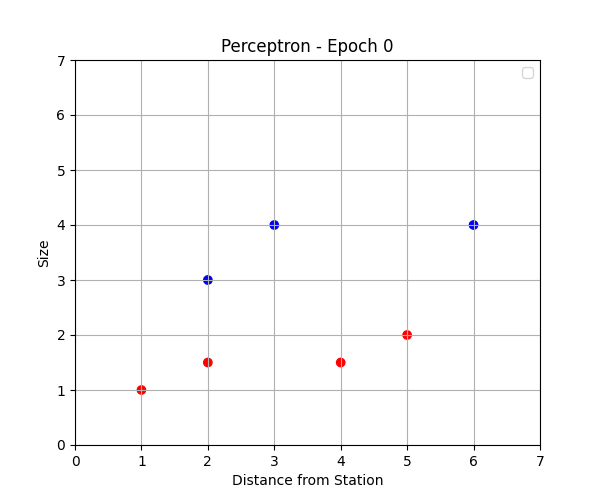

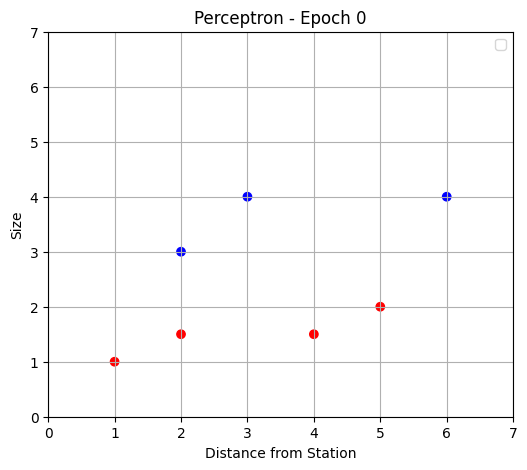

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Image
# Data
X_class = np.array([[2, 3], [1, 1], [2, 1.5], [3, 4], [5, 2], [6, 4], [4, 1.5]])
prices = np.array([700, 360, 420, 665, 390, 770, 330])

y_perceptron = np.where(prices > 650, 1, -1)

# Perceptron Calssification Model
class PerceptronClassifier:
    def __init__(self, learning_rate=0.01, epochs=100):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []

    def fit(self, X, y):
        self.w = np.zeros(X.shape[1])
        self.b = 0.0
        self.weight_history = [(self.w.copy(), self.b)]

        for _ in range(self.epochs):
            for xi, yi in zip(X, y):
                if yi * (np.dot(xi, self.w) + self.b) <= 0:
                    self.w += self.lr * yi * xi
                    self.b += self.lr * yi
            self.weight_history.append((self.w.copy(), self.b))
        return self

# Train
clf_model = PerceptronClassifier().fit(X_class, y_perceptron)

# Animate
fig_clf, ax_clf = plt.subplots(figsize=(6, 5))
x_vals = np.linspace(0, 7, 100)

def update_clf(epoch):
    ax_clf.clear()
    w, b = clf_model.weight_history[epoch]
    ax_clf.scatter(X_class[:, 0], X_class[:, 1],
                   c=['blue' if y == 1 else 'red' for y in y_perceptron])
    if w[1] != 0:
        y_vals = -(w[0] * x_vals + b) / w[1]
        ax_clf.plot(x_vals, y_vals, 'k--', label='Decision Boundary')
    ax_clf.set_xlim(0, 7)
    ax_clf.set_ylim(0, 7)
    ax_clf.set_title(f'Perceptron - Epoch {epoch}')
    ax_clf.set_xlabel("Distance from Station")
    ax_clf.set_ylabel("Size")
    ax_clf.grid(True)
    ax_clf.legend()

ani_clf = FuncAnimation(fig_clf, update_clf, frames=len(clf_model.weight_history), interval=800)
ani_clf.save("perceptron_classification.gif", writer="pillow")
Image("perceptron_classification.gif")


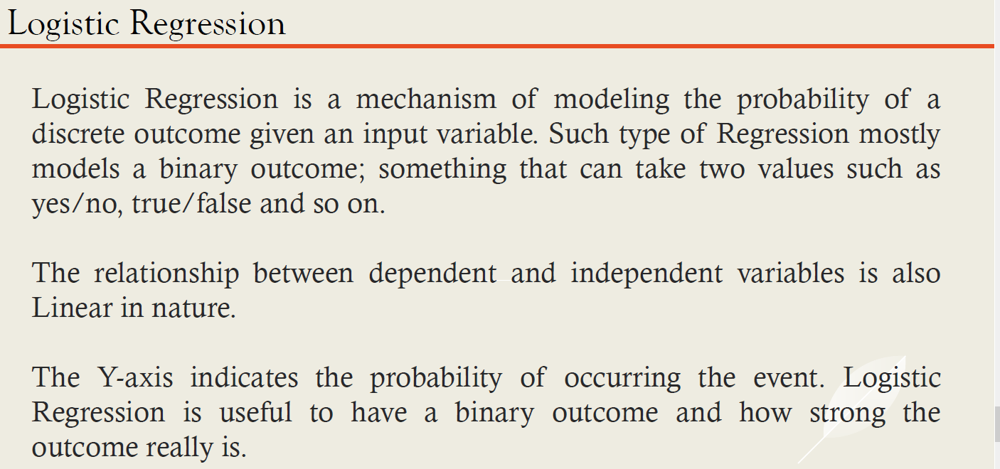

/tmp/ipython-input-1377762078.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_log.legend()


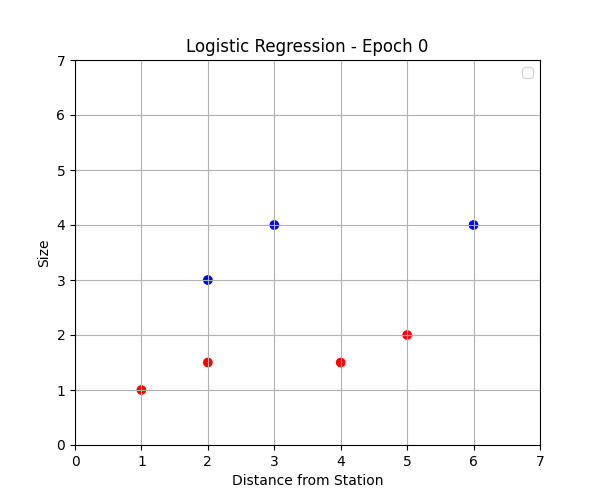

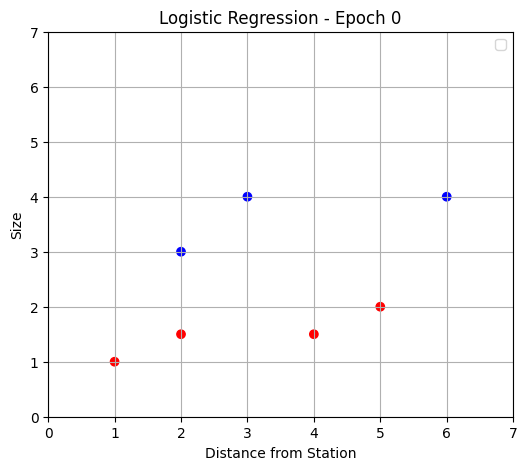

In [ ]:
# Logistic Labels
y_logistic = np.where(prices > 650, 1, 0)

# Logistic Regression Model
class LogisticRegressionGD:
    def __init__(self, learning_rate=0.1, epochs=100):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []

    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))

    def fit(self, X, y):
        self.w = np.zeros(X.shape[1])
        self.b = 0.0
        self.weight_history = [(self.w.copy(), self.b)]

        for _ in range(self.epochs):
            z = np.dot(X, self.w) + self.b
            # sigmoid
            predictions = self.sigmoid(z)
            # Even if it's correctly classified, weights are updated slightly
            errors = predictions - y
            dw = np.dot(X.T, errors) / len(y)
            db = np.sum(errors) / len(y)
            self.w -= self.lr * dw
            self.b -= self.lr * db
            self.weight_history.append((self.w.copy(), self.b))
        return self

# Train
log_model = LogisticRegressionGD().fit(X_class, y_logistic)

# Animate
fig_log, ax_log = plt.subplots(figsize=(6, 5))

def update_log(epoch):
    ax_log.clear()
    w, b = log_model.weight_history[epoch]
    ax_log.scatter(X_class[:, 0], X_class[:, 1],
                   c=['blue' if y == 1 else 'red' for y in y_logistic])
    if w[1] != 0:
        y_vals = -(w[0] * x_vals + b) / w[1]
        ax_log.plot(x_vals, y_vals, 'g--', label='Decision Boundary')
    ax_log.set_xlim(0, 7)
    ax_log.set_ylim(0, 7)
    ax_log.set_title(f'Logistic Regression - Epoch {epoch}')
    ax_log.set_xlabel("Distance from Station")
    ax_log.set_ylabel("Size")
    ax_log.grid(True)
    ax_log.legend()

ani_log = FuncAnimation(fig_log, update_log, frames=len(log_model.weight_history), interval=800)
ani_log.save("logistic_regression.gif", writer="pillow")
Image("logistic_regression.gif")


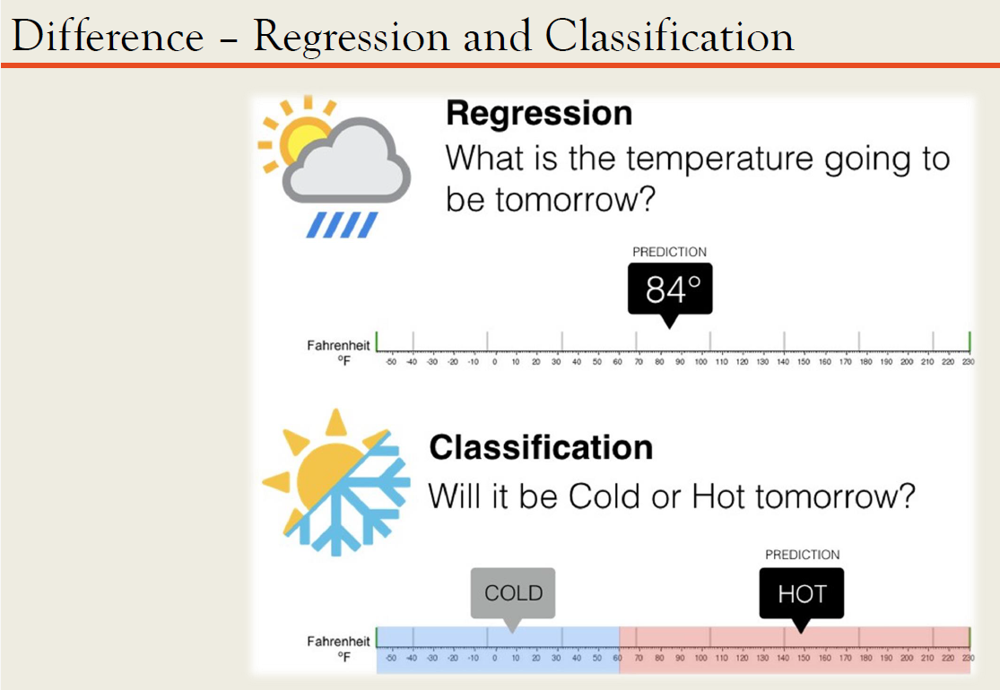

**Logistic Regression** our objective is to classify whether an apartment is overpriced or not — a binary decision — and we care about probabilistic reasoning and flexibility, logistic regression is more appropriate than linear regression or perceptron. It provides both a soft decision boundary and an interpretable measure of classification confidence, which is crucial for real-world decision-making.

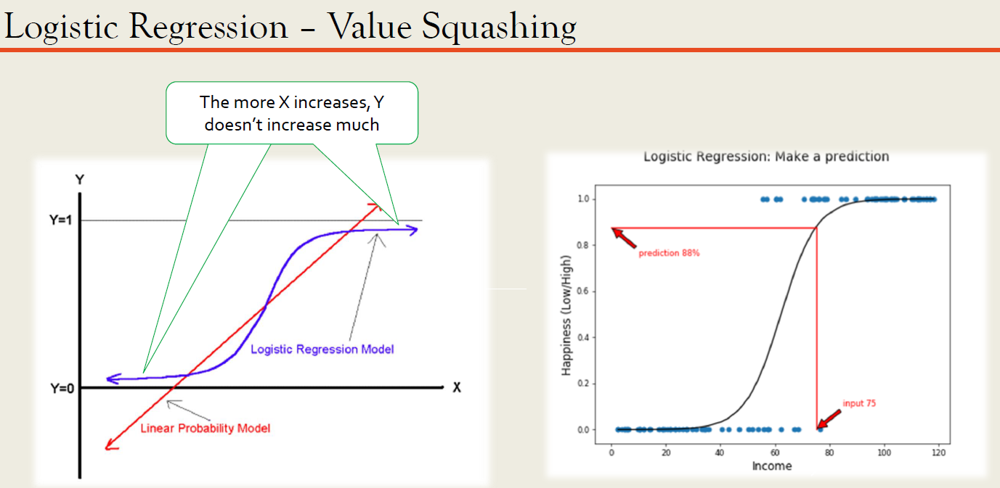

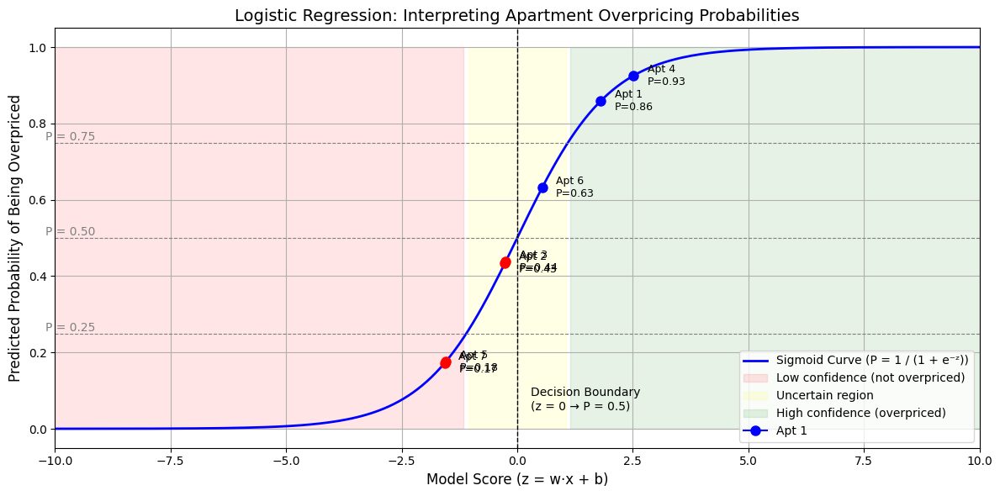

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Logistic sigmoid function
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

# Apartment dataset
X_class = np.array([[2, 3], [1, 1], [2, 1.5], [3, 4], [5, 2], [6, 4], [4, 1.5]])
prices = np.array([700, 360, 420, 665, 390, 770, 330])
y_logistic = np.where(prices > 650, 1, 0)

# Trained logistic regression model (assume already trained)
class LogisticRegressionGD:
    def __init__(self, learning_rate=0.1, epochs=100):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []

    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))

    def fit(self, X, y):
        self.w = np.zeros(X.shape[1])
        self.b = 0.0
        self.weight_history = [(self.w.copy(), self.b)]
        for _ in range(self.epochs):
            z = np.dot(X, self.w) + self.b
            predictions = self.sigmoid(z)
            errors = predictions - y
            dw = np.dot(X.T, errors) / len(y)
            db = np.sum(errors) / len(y)
            self.w -= self.lr * dw
            self.b -= self.lr * db
            self.weight_history.append((self.w.copy(), self.b))
        return self

    def predict_proba(self, X):
        return self.sigmoid(np.dot(X, self.w) + self.b)

# Train model
log_model = LogisticRegressionGD().fit(X_class, y_logistic)

# Final weights
w_log, b_log = log_model.weight_history[-1]

# Compute z-scores and probabilities for all apartments
z_apts = np.dot(X_class, w_log) + b_log
p_apts = sigmoid(z_apts)

# Create sigmoid curve
z_vals = np.linspace(-10, 10, 200)
sigmoid_vals = sigmoid(z_vals)

# sigmoid plot with apartment labels and confidence regions
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the sigmoid curve
ax.plot(z_vals, sigmoid_vals, 'b-', linewidth=2, label="Sigmoid Curve (P = 1 / (1 + e⁻ᶻ))")

# Horizontal lines for key probability thresholds
for p in [0.25, 0.5, 0.75]:
    ax.axhline(p, color='gray', linestyle='--', linewidth=0.8)
    ax.text(-10.2, p + 0.015, f"P = {p:.2f}", fontsize=10, color='gray', va='center')

# Vertical decision boundary
ax.axvline(0, color='black', linestyle='--', linewidth=1)
ax.text(0.3, 0.05, "Decision Boundary\n(z = 0 → P = 0.5)", fontsize=10, color='black', ha='left')

# Shade low, uncertain, and high probability zones
ax.fill_between(z_vals, 0, 1, where=(sigmoid_vals <= 0.25), color='red', alpha=0.1, label="Low confidence (not overpriced)")
ax.fill_between(z_vals, 0, 1, where=(sigmoid_vals > 0.25) & (sigmoid_vals < 0.75), color='yellow', alpha=0.1, label="Uncertain region")
ax.fill_between(z_vals, 0, 1, where=(sigmoid_vals >= 0.75), color='green', alpha=0.1, label="High confidence (overpriced)")

# Plot apartment probabilities with labels
for i in range(len(z_apts)):
    color = 'blue' if y_logistic[i] == 1 else 'red'
    ax.plot([z_apts[i]], [p_apts[i]], marker='o', markersize=8, color=color, label=f"Apt {i+1}" if i == 0 else "")
    ax.text(z_apts[i] + 0.3, p_apts[i], f"Apt {i+1}\nP={p_apts[i]:.2f}", fontsize=9, color='black', va='center')

# Final labels and styling
ax.set_title("Logistic Regression: Interpreting Apartment Overpricing Probabilities", fontsize=14)
ax.set_xlabel("Model Score (z = w·x + b)", fontsize=12)
ax.set_ylabel("Predicted Probability of Being Overpriced", fontsize=12)
ax.set_xlim(-10, 10)
ax.set_ylim(-0.05, 1.05)
ax.legend(loc="lower right")
ax.grid(True)

plt.tight_layout()
plt.show()


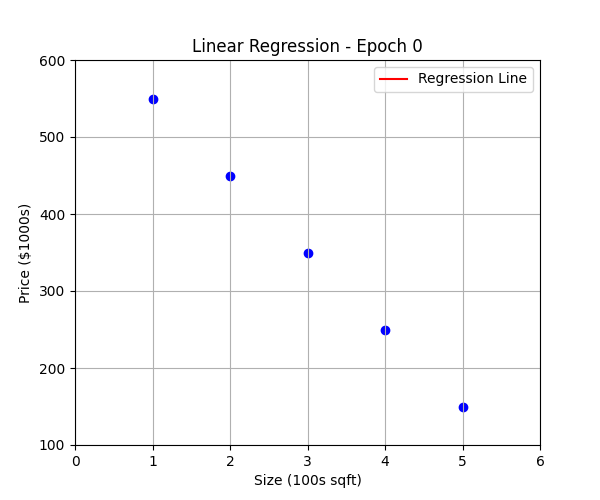

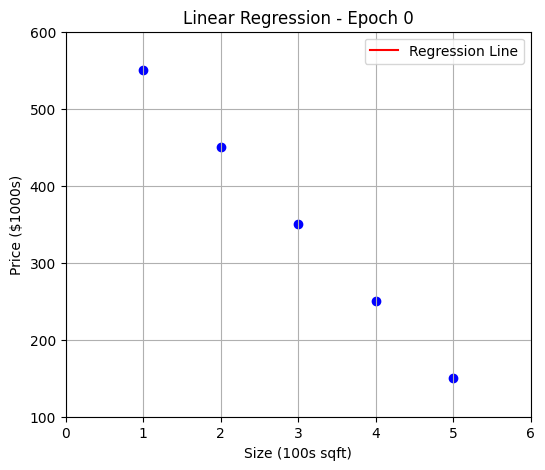

In [ ]:


# Data
x_lr = np.array([1, 2, 3, 4, 5])
y_lr = np.array([550, 450, 350, 250, 150])

# Linear Regression Model
class LinearRegressionGD:
    def __init__(self, learning_rate=0.01, epochs=200):
        self.lr = learning_rate
        self.epochs = epochs
        self.weight_history = []

    def fit(self, x, y):
        self.w = 0.0
        self.b = 0.0
        self.weight_history = [(self.w, self.b)]

        for _ in range(self.epochs):
            for xi, yi in zip(x, y):
                y_pred = self.w * xi + self.b
                error = y_pred - yi
                self.w -= self.lr * 2 * error * xi
                self.b -= self.lr * 2 * error
            self.weight_history.append((self.w, self.b))
        return self

# Train
lr_model = LinearRegressionGD().fit(x_lr, y_lr)

# Animate
fig_lr, ax_lr = plt.subplots(figsize=(6, 5))
x_vals = np.linspace(0, 6, 100)

def update_lr(epoch):
    ax_lr.clear()
    w, b = lr_model.weight_history[epoch]
    ax_lr.scatter(x_lr, y_lr, color='blue')
    ax_lr.plot(x_vals, w * x_vals + b, 'r-', label='Regression Line')
    ax_lr.set_xlim(0, 6)
    ax_lr.set_ylim(100, 600)
    ax_lr.set_title(f'Linear Regression - Epoch {epoch}')
    ax_lr.set_xlabel("Size (100s sqft)")
    ax_lr.set_ylabel("Price ($1000s)")
    ax_lr.grid(True)
    ax_lr.legend()

ani_lr = FuncAnimation(fig_lr, update_lr, frames=len(lr_model.weight_history), interval=800)
ani_lr.save("linear_regression.gif", writer="pillow")
Image("linear_regression.gif")


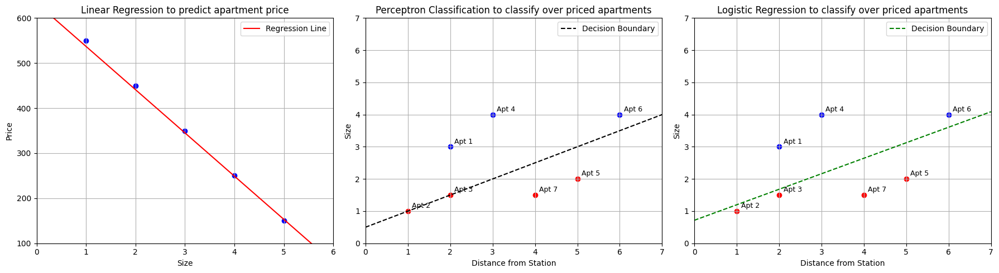

In [ ]:
# 1. Get final weights
w_lr, b_lr = lr_model.weight_history[-1]
w_clf, b_clf = clf_model.weight_history[-1]
w_log, b_log = log_model.weight_history[-1]

# 2. Create X range
x_vals = np.linspace(0, 7, 100)

# 3. Compute lines
y_vals_lr = w_lr * x_vals + b_lr
y_vals_clf = -(w_clf[0] * x_vals + b_clf) / w_clf[1] if w_clf[1] != 0 else np.zeros_like(x_vals)
y_vals_log = -(w_log[0] * x_vals + b_log) / w_log[1] if w_log[1] != 0 else np.zeros_like(x_vals)

# 4. Plot all side-by-side
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
titles = ['Linear Regression to predict apartment price', 'Perceptron Classification to classify over priced apartments', 'Logistic Regression to classify over priced apartments']

# Linear Regression
axs[0].scatter(x_lr, y_lr, color='blue')
axs[0].plot(x_vals, y_vals_lr, 'r-', label='Regression Line')
axs[0].set_title(titles[0])
axs[0].set_xlim(0, 6)
axs[0].set_ylim(100, 600)
axs[0].set_xlabel("Size")
axs[0].set_ylabel("Price")
axs[0].legend()
axs[0].grid(True)

# Perceptron Classification
for i in range(len(X_class)):
    color = 'blue' if y_perceptron[i] == 1 else 'red'
    axs[1].scatter(X_class[i, 0], X_class[i, 1], color=color)
    axs[1].text(X_class[i, 0]+0.1, X_class[i, 1]+0.1, f"Apt {i+1}", fontsize=9)
axs[1].plot(x_vals, y_vals_clf, 'k--', label='Decision Boundary')
axs[1].set_title(titles[1])
axs[1].set_xlim(0, 7)
axs[1].set_ylim(0, 7)
axs[1].set_xlabel("Distance from Station")
axs[1].set_ylabel("Size")
axs[1].legend()
axs[1].grid(True)

# Logistic Regression
for i in range(len(X_class)):
    color = 'blue' if y_logistic[i] == 1 else 'red'
    axs[2].scatter(X_class[i, 0], X_class[i, 1], color=color)
    axs[2].text(X_class[i, 0]+0.1, X_class[i, 1]+0.1, f"Apt {i+1}", fontsize=9)
axs[2].plot(x_vals, y_vals_log, 'g--', label='Decision Boundary')
axs[2].set_title(titles[2])
axs[2].set_xlim(0, 7)
axs[2].set_ylim(0, 7)
axs[2].set_xlabel("Distance from Station")
axs[2].set_ylabel("Size")
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

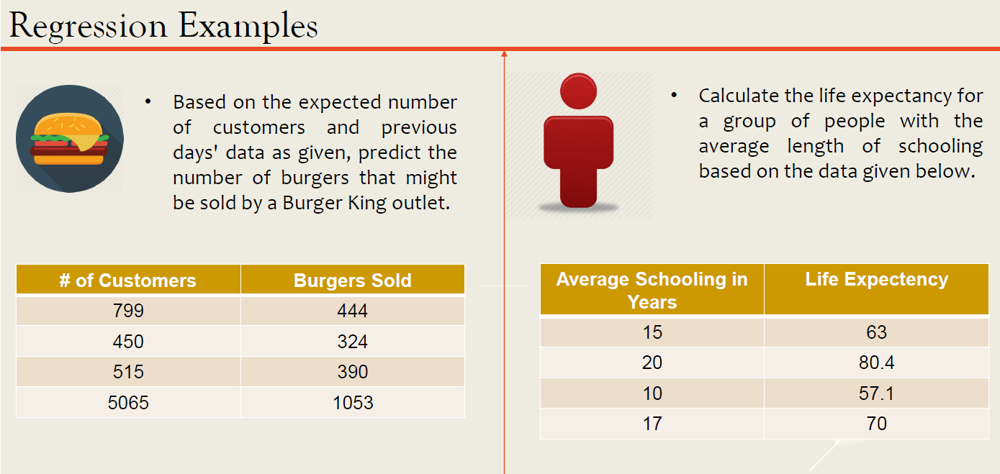

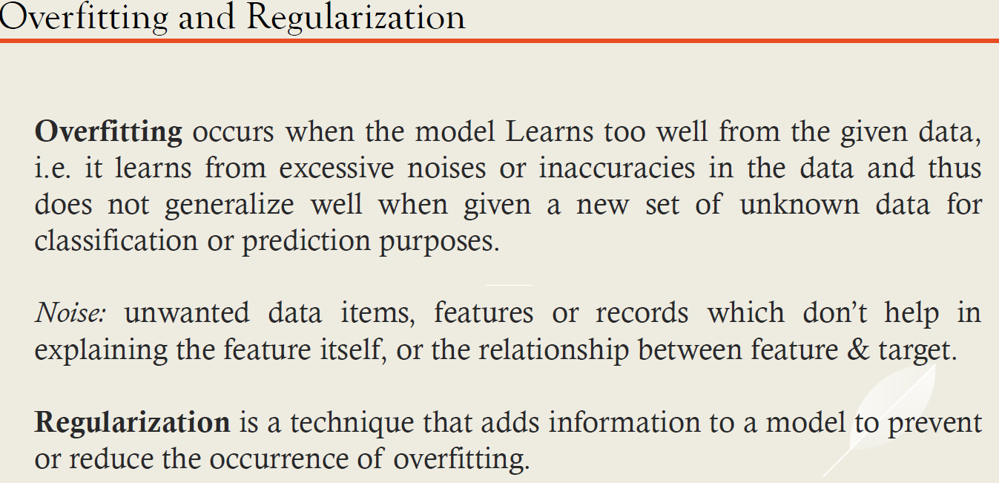

**Apartment price data that do not depend linearly on the size and you need to predict the price given the size as feature**

| Apartment Size (100s sqft) | Price (\$1000s) |
| -------------------------- | --------------- |
| 1.0                        | 540             |
| 1.5                        | 535             |
| 2.0                        | 530             |
| 2.5                        | 525             |
| 3.0                        | 500             |
| 3.5                        | 480             |
| 4.0                        | 470             |
| 4.5                        | 490             |
| 5.0                        | 520             |
| 5.5                        | 580             |
| 6.0                        | 700             |
| 6.5                        | 730             |
| 7.0                        | 750             |
| 7.5                        | 720             |
| 8.0                        | 710             |
| 8.5                        | 700             |
| 9.0                        | 690             |
| 9.5                        | 720             |
| 10.0                       | 760             |


/usr/local/lib/python3.11/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=6.75307e-20): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.280e+03, tolerance: 1.492e+01
  model = cd_fast.enet_coordinate_descent(


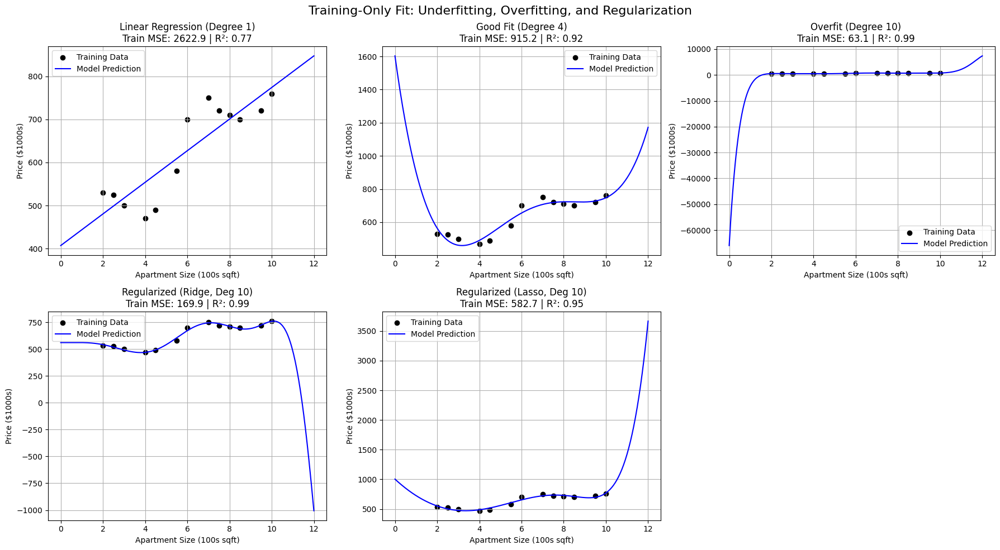

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score

# 1. More challenging apartment pricing data (nonlinear + realistic)
x_apts = np.array([
    1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5,
    5.5, 6, 6.5, 7, 7.5, 8, 8.5, 9, 9.5, 10
]).reshape(-1, 1)

y_apts = np.array([
    540, 535, 530, 525, 500, 480, 470, 490, 520,
    580, 700, 730, 750, 720, 710, 700, 690, 720, 760
])

# 2. Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    x_apts, y_apts, test_size=0.3, random_state=42
)
# random state for reproducability

# 3. Models: underfit, good fit, overfit, regularized Ridge and Lasso
models = {
    "Linear Regression (Degree 1)": make_pipeline(PolynomialFeatures(degree=1), LinearRegression()),
    "Good Fit (Degree 4)": make_pipeline(PolynomialFeatures(degree=4), LinearRegression()),
    "Overfit (Degree 10)": make_pipeline(PolynomialFeatures(degree=10), LinearRegression()),
    "Regularized (Ridge, Deg 10)": make_pipeline(PolynomialFeatures(degree=10), Ridge(alpha=10)),
    "Regularized (Lasso, Deg 10)": make_pipeline(PolynomialFeatures(degree=10), Lasso(alpha=0.1, max_iter=10000))
}
# Ridge is useful when all features are helpful, but we want to control model complexity.

# Lasso is useful when we think some features are useless, and we want the model to discover which ones.

# 4. Domain for curve prediction
x_test_outside = np.linspace(0, 12, 300).reshape(-1, 1)

# Plot showing predictions using training data only for each model

fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs = axs.flatten()



for i, (label, model) in enumerate(models.items()):
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_curve_pred = model.predict(x_test_outside)

    mse_train = mean_squared_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    axs[i].scatter(X_train, y_train, color='black', label='Training Data')
    axs[i].plot(x_test_outside, y_curve_pred, color='blue', label='Model Prediction')

    axs[i].set_title(
        f"{label}\nTrain MSE: {mse_train:.1f} | R²: {r2_train:.2f}"
    )
    axs[i].set_xlabel("Apartment Size (100s sqft)")
    axs[i].set_ylabel("Price ($1000s)")
    axs[i].grid(True)
    axs[i].legend()

# Remove empty subplot if not needed
if len(models) < len(axs):
    fig.delaxes(axs[-1])

plt.suptitle("Training-Only Fit: Underfitting, Overfitting, and Regularization", fontsize=16)
plt.tight_layout()
plt.show()




| Model                      | Train MSE    | Train R²                   | Fit Behavior                                      |
| -------------------------- | ------------ | -------------------------- | ------------------------------------------------- |
| **Linear (Deg 1)**         | High MSE     | Low R²                     | Clearly underfits — can’t follow pattern          |
| **Good Fit (Deg 4)**       | Low MSE      | High R²                    | Follows trend well — ideal balance                |
| **Overfit (Deg 10)**       | Very low MSE | Near-perfect R²            | Fits training points tightly, may be too flexible |
| **Ridge / Lasso (Deg 10)** | Low MSE      | Slightly less than overfit | Regularized fit, smoother, avoids wild swings     |

Because a model fits the training data perfectly doesn’t mean it’s a good model.

**How to Detect Overfitting?** comparing with the test set, where overfitting will fail.

/usr/local/lib/python3.11/dist-packages/scipy/_lib/_util.py:1233: LinAlgWarning: Ill-conditioned matrix (rcond=6.75307e-20): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.280e+03, tolerance: 1.492e+01
  model = cd_fast.enet_coordinate_descent(


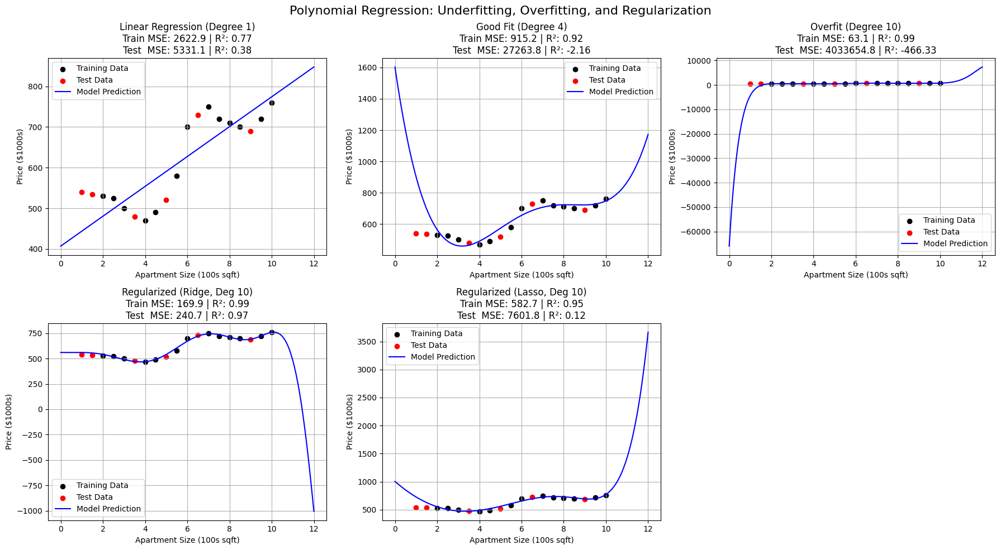

In [ ]:




# 5. Plot results
fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs = axs.flatten()

for i, (label, model) in enumerate(models.items()):
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    y_curve_pred = model.predict(x_test_outside)

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    axs[i].scatter(X_train, y_train, color='black', label='Training Data')
    axs[i].scatter(X_test, y_test, color='red', label='Test Data')
    axs[i].plot(x_test_outside, y_curve_pred, color='blue', label='Model Prediction')

    axs[i].set_title(
        f"{label}\nTrain MSE: {mse_train:.1f} | R²: {r2_train:.2f}\n"
        f"Test  MSE: {mse_test:.1f} | R²: {r2_test:.2f}"
    )
    axs[i].set_xlabel("Apartment Size (100s sqft)")
    axs[i].set_ylabel("Price ($1000s)")
    axs[i].grid(True)
    axs[i].legend()

# Remove empty subplot if fewer than 6 models
if len(models) < len(axs):
    fig.delaxes(axs[-1])

plt.suptitle("Polynomial Regression: Underfitting, Overfitting, and Regularization", fontsize=16)
plt.tight_layout()
plt.show()


| Model            | Train MSE | Test MSE | Overfit?      | Generalization |
| ---------------- | --------- | -------- | ------------- | -------------- |
| Linear (Deg 1)   | High      | High     |  No          |  Poor         |
| Good Fit (Deg 4) | Low       | Low      |  No          |  Strong       |
| Overfit (Deg 10) | Very Low  | High     |  Yes         |  Poor         |
| Ridge (Deg 10)   | Low       | Better   |  Controlled  |   Improved     |
| Lasso (Deg 10)   | Moderate  | Best     |  Penalized   |  Best overall |

Even though overfitting gives perfect training accuracy, it fails in generalization. Regularization helps control complexity and improves performance on unseen data.

**When to call it overfitting?**
1. Visualizing residuals gives a clear, intuitive sense of error.If residuals are low only on training but high on test — that’s overfitting.
2. If the model behaves completely differently on different test-training splitting, its overfitting.


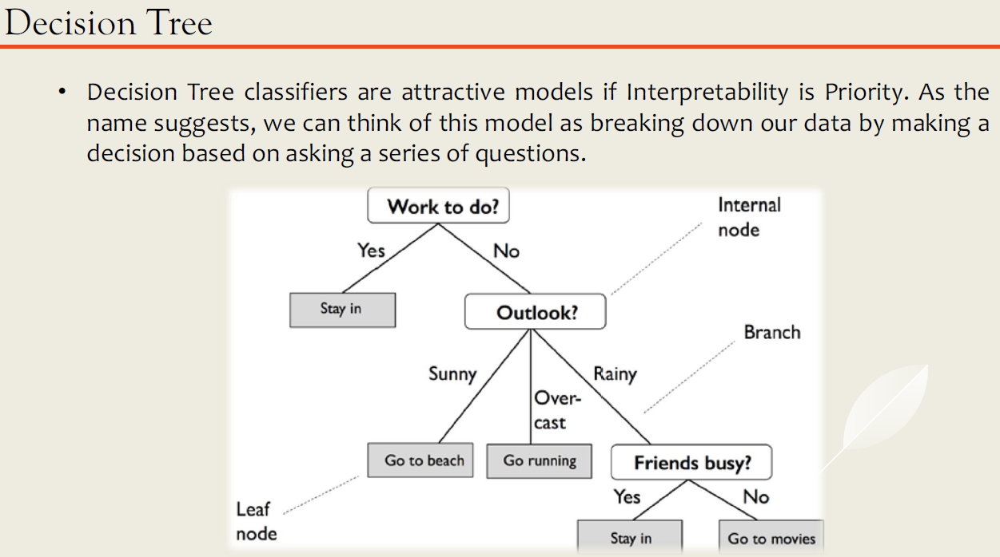

**Decision Trees are like a game of multiple Questions to find an answer for the predicted label**

A decision tree is like a flexible interviewer — it can ask yes/no questions, multiple-choice questions (multiple branches from the same node), or numeric comparison questions (with threshold/s), all in the same conversation.

you start from a general question (root node) and narrow down options by asking more specific ones.

They’re important because they mirror human decision-making, making them easy to understand and explain — crucial for domains where transparency is required, like finance or healthcare.

1. Root Node: The “biggest decision” first — chosen for maximum information gain.

2. Branches/Sub-Trees: Like “follow-up questions” after the main question.

3. Leaf Nodes: The final answer/decision.

**In scikit-learn**, the default implementation only does binary splits (even for categorical features), so multi-category features are split into binary groupings internally.

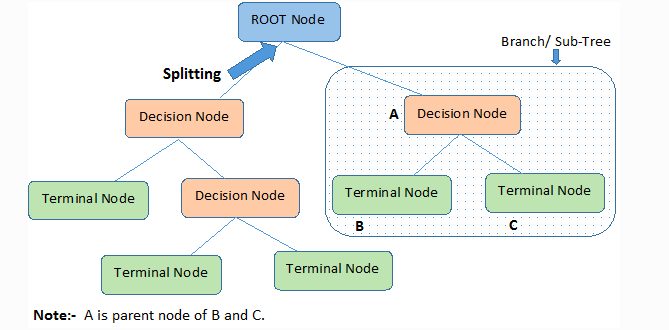

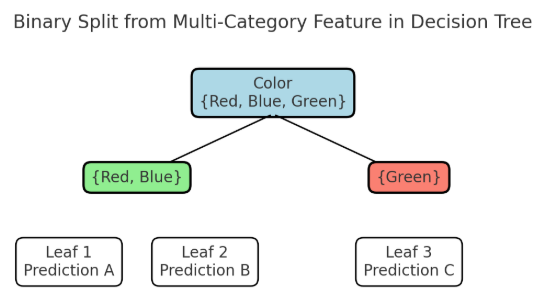

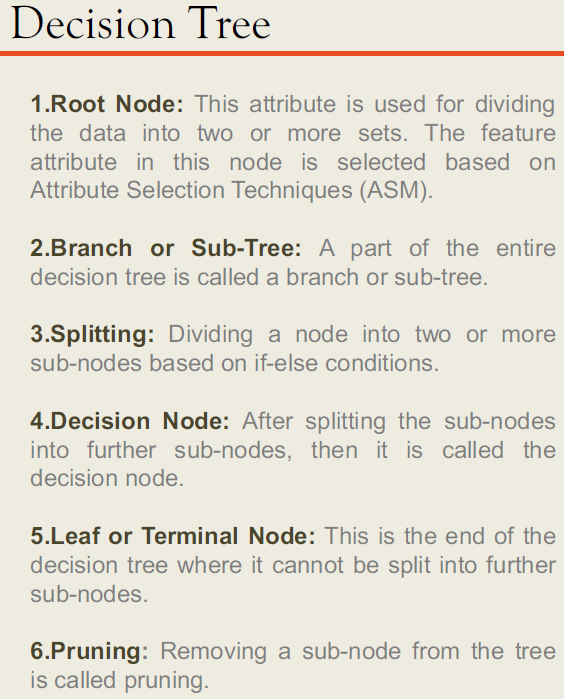

Pruning: Removing unnecessary questions so the model doesn’t “overthink” and overfit.

**Avoiding Overfitting**

Hyperparameters: max_depth, min_samples_split, min_samples_leaf and stopping criteria — tuning these is problem-dependent.

1. Step 1: Pick root node.

*   Calculate *Entropy* for all the features
*   Find out the *Information Gain (IG)* for each of the features
*   Choose the one with Highest IG, this will be the Root Node, Root Node is also a Parent Node.

2. Step 2: Decide the splitting threshold.

*   The values should be from the set of values for the parent
feature that can produce most efficient subtrees.
*   partition the training set into subsets until
each partition is either "pure" in terms of target class or
sufficiently small.

3. Step 3: Create branches.

*   Create the Subtrees

4. Step 4: Repeat until stop condition met.

*   Repeat the whole process for the subtrees, until the entropy
reaches 0, it should decrease gradually
*   Or use other stopping criteria


# Decision Trees: Entropy & Information Gain

**Goal:**  Entropy and Information Gain (IG) on `Loan_1.csv`.

We will:
1) Drop rows with missing values (NaNs) in the relevant columns,  
2) Use **log base-10** in Shannon entropy (to match the slides),  
3) Compute parent entropy for `Loan_Status`, and  
4) Compute IG for each feature and identify the root feature.


The entropy for the `Loan_Status` is calculated from the distribution of the target classes in the whole dataset — before any splitting happens.

Step 1 — Count class labels
Count how many Loan_Status entries are Y (approved) and how many are N (not approved).

Step 2 — Convert to proportions
pY = count(Y) / total_samples
pN = count(N) / total_samples

Step 3 — Parent entropy (base-2 logarithm)
Entropy_parent = -( pY * log2(pY) + pN * log2(pN) )

- If classes are evenly split (maximum uncertainty), entropy is higher.
- If one class dominates (low uncertainty), entropy is lower.

Note: “total_samples” is the number of rows in the dataset (after any filtering).


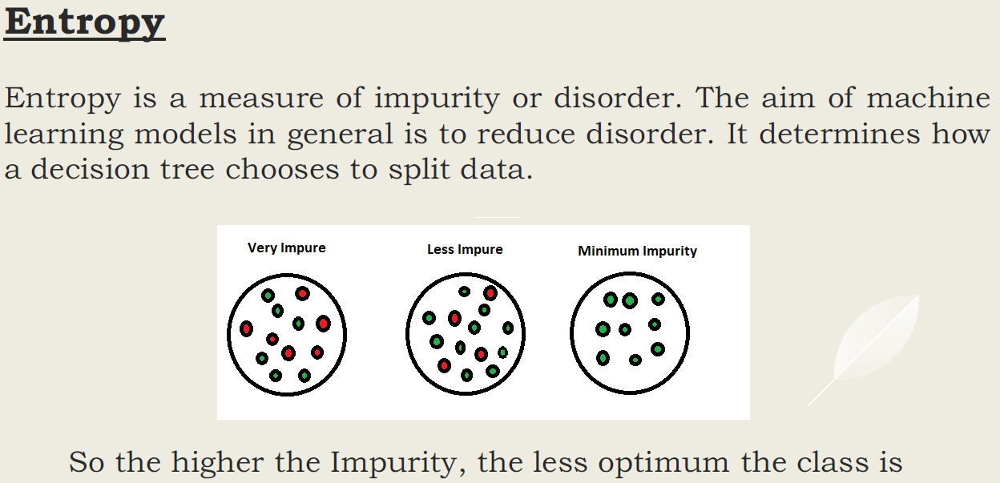

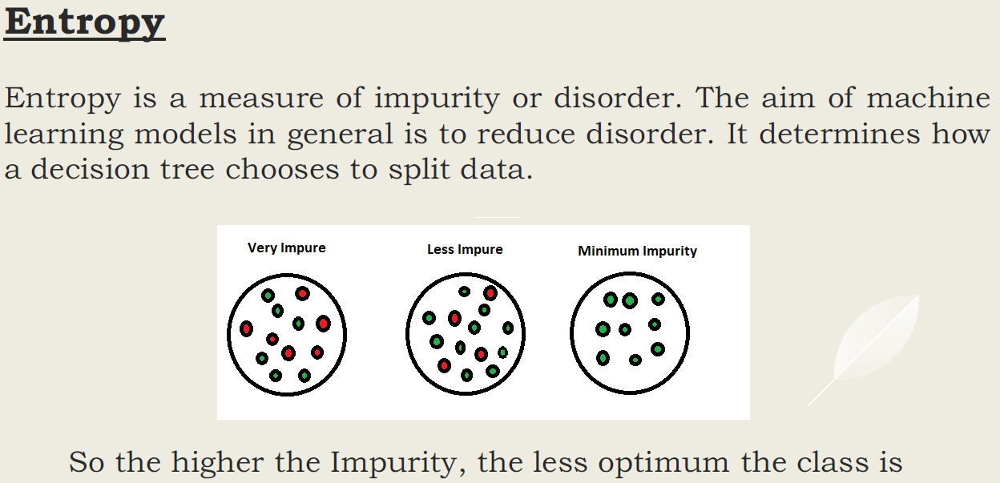

Class probabilities:
 Loan_Status
Y    0.685619
N    0.314381
Name: count, dtype: float64


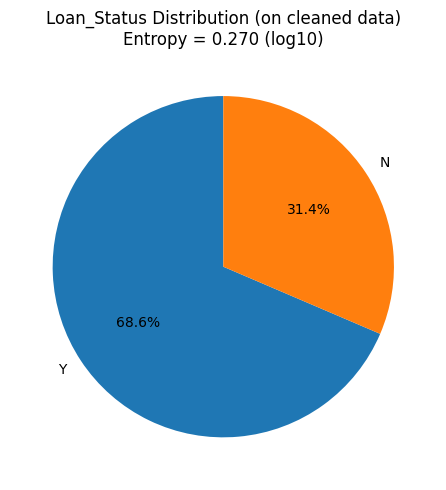

In [ ]:
import pandas as pd
import math
import numpy as np
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("Loan_1.csv")

# Columns
target_col = "Loan_Status"
feature_cols = ["Self_Employed", "Credit_History", "Education", "Gender", "Married"]

# Drop rows with NaNs in target or any of the feature columns
df_clean = df.dropna(subset=[target_col] + feature_cols).copy()
y = df_clean[target_col].astype(str)

# Entropy function
def entropy_base10(series, verbose=False) -> float:
    """Shannon entropy using log10 (matches slides)."""
    counts = series.value_counts(dropna=True)
    probs = counts / counts.sum()
    if verbose:
        print("Class probabilities:\n", probs)
    return -sum(p * math.log(p, 10) for p in probs if p > 0)

# Calculate entropy once (set verbose=True if you want to debug)
parent_entropy = entropy_base10(y, verbose=True)

# Count target classes
target_counts = y.value_counts()

# Plot pie chart
plt.figure(figsize=(5, 5))
plt.pie(
    target_counts.values,
    labels=target_counts.index,
    autopct="%1.1f%%",
    startangle=90
)
plt.title(
    f"Loan_Status Distribution (on cleaned data)\n"
    f"Entropy = {parent_entropy:.3f} (log10)"
)
plt.tight_layout()
plt.show()

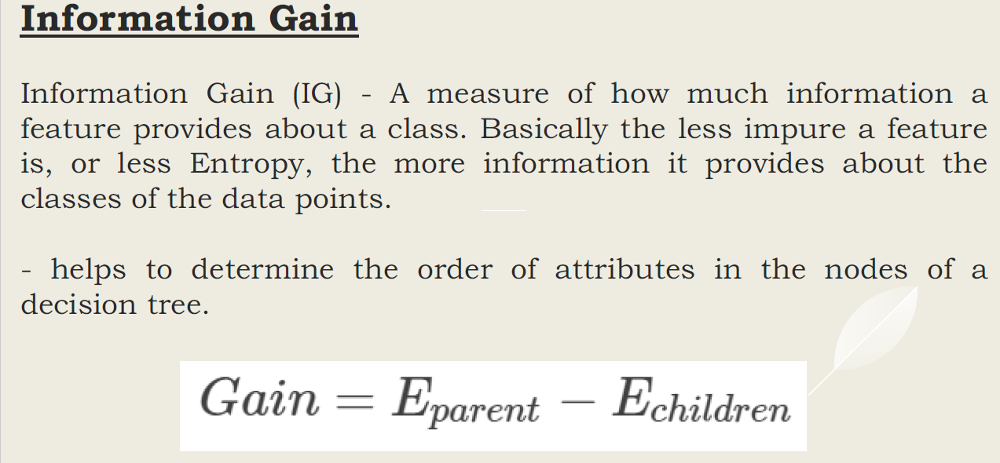

In [ ]:
def split_details_for_feature(df_, feature, target):
    rows = []
    weighted_child_entropy = 0.0
    n = len(df_)
    for v, subset in df_.groupby(feature, dropna=False):
        w = len(subset) / n
        h = entropy_base10(subset[target].astype(str))
        weighted_child_entropy += w * h
        rows.append({"value": v, "count": len(subset), "weight": w, "child_entropy": h})
    return pd.DataFrame(rows), weighted_child_entropy

# Step-by-step for Credit_History
credit_df, weighted_children_H = split_details_for_feature(df_clean, "Credit_History", target_col)
ig_credit = parent_entropy - weighted_children_H

display(credit_df.sort_values("value"))
print(f"Parent Entropy H_10(Loan_Status) = {parent_entropy:.3f}")
print(f"Weighted Child Entropy for Credit_History = {weighted_children_H:.3f}")
print(f"IG_10(Loan_Status, Credit_History) = {ig_credit:.6f}")


,value,count,weight,child_entropy
0,0.0,43,0.143813,0.156105
1,1.0,256,0.856187,0.228144


Parent Entropy H_10(Loan_Status) = 0.270
Weighted Child Entropy for Credit_History = 0.218
IG_10(Loan_Status, Credit_History) = 0.052591


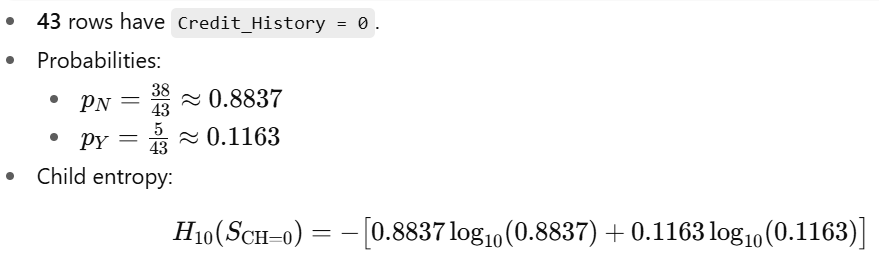

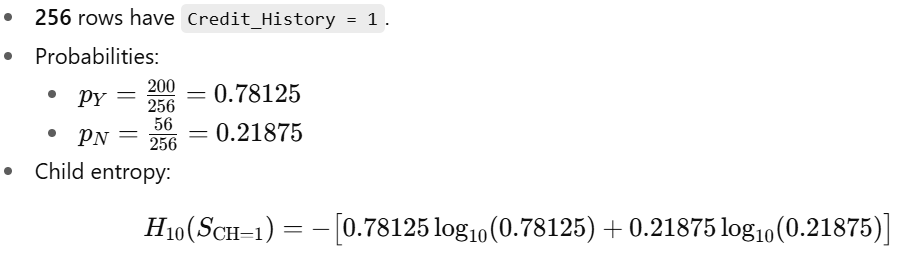

In [ ]:
def split_details_for_feature(df_, feature, target):
    """
    Compute child entropies for a given feature, ignoring rows where
    the current feature OR the target is NaN. Returns:
      - details dataframe (value, count, weight, child_entropy)
      - weighted_child_entropy (base-10)
      - parent_entropy_for_this_feature (base-10, computed on the same filtered rows)
      - n (row count used after filtering)
    """
    # 1) Filter out NaNs ONLY for the current feature + target
    df_no_nan = df_.dropna(subset=[feature, target]).copy()
    n = len(df_no_nan)
    if n == 0:
        raise ValueError(f"No rows left after dropping NaNs for feature '{feature}' and target '{target}'.")

    # 2) Parent entropy on the filtered rows (important for consistent IG)
    parent_entropy_feat = entropy_base10(df_no_nan[target].astype(str))

    # 3) Children entropies/weights
    rows = []
    weighted_child_entropy = 0.0
    for v, subset in df_no_nan.groupby(feature):
        w = len(subset) / n
        h = entropy_base10(subset[target].astype(str))
        weighted_child_entropy += w * h
        print("child_entropy: ", h)

        rows.append({
            "value": v,
            "count": len(subset),
            "weight": w,
            "child_entropy": h
        })

    return pd.DataFrame(rows), weighted_child_entropy, parent_entropy_feat, n

# Step-by-step for Credit_History (NaNs in this feature/target are ignored)
credit_df, weighted_children_H, parent_entropy_feat, n_used = split_details_for_feature(
    df_clean, "Credit_History", target_col
)
ig_credit = parent_entropy_feat - weighted_children_H

display(credit_df.sort_values("value"))
print(f"Rows used (after filtering): {n_used}")
print(f"Parent Entropy H_10(Loan_Status) [filtered] = {parent_entropy_feat:.3f}")
print(f"Weighted Child Entropy for Credit_History   = {weighted_children_H:.3f}")
print(f"IG_10(Loan_Status, Credit_History)          = {ig_credit:.6f}")



sum of counts:  299
Loan_Status
Y    0.685619
N    0.314381
Name: count, dtype: float64
sum of counts:  43
Loan_Status
N    0.883721
Y    0.116279
Name: count, dtype: float64
child_entropy:  0.15610504411170556
sum of counts:  256
Loan_Status
Y    0.78125
N    0.21875
Name: count, dtype: float64
child_entropy:  0.22814415029175789


,value,count,weight,child_entropy
0,0.0,43,0.143813,0.156105
1,1.0,256,0.856187,0.228144


Rows used (after filtering): 299
Parent Entropy H_10(Loan_Status) [filtered] = 0.270
Weighted Child Entropy for Credit_History   = 0.218
IG_10(Loan_Status, Credit_History)          = 0.052591


In [ ]:
print("wi: ",43/299, "w2: ", 256/299)
print((43/299)*0.156105+(256/299)*0.228144)

wi:  0.14381270903010032 w2:  0.8561872909698997
0.2177838762541806


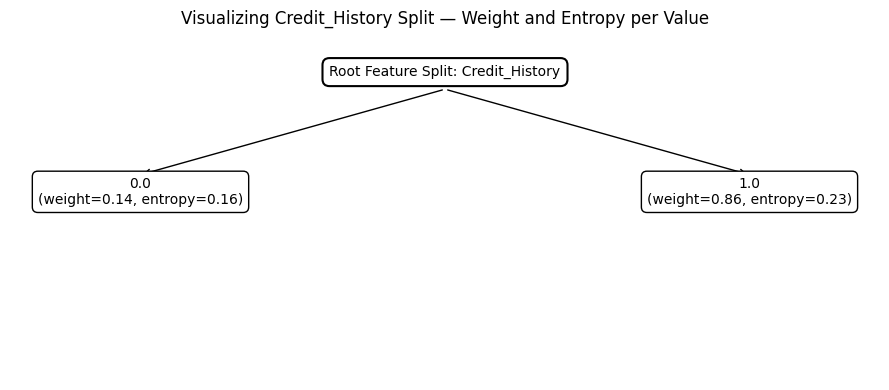

In [ ]:

fig, ax = plt.subplots(figsize=(9, 4))

# Header box for the root feature
ax.text(
    0.5, 0.9,
    'Root Feature Split: Credit_History',
    ha='center', va='center',
    bbox=dict(boxstyle='round,pad=0.5', fc='white', ec='black', lw=1.5)
)

# Limit how many child values are drawn
max_split_values = 6
split_values = list(credit_df["value"])[:max_split_values]
x_positions = np.linspace(0.15, 0.85, len(split_values))

# Arrows and labels for each child node
for x, value in zip(x_positions, split_values):
    ax.annotate('', xy=(x, 0.6), xytext=(0.5, 0.85), arrowprops=dict(arrowstyle='->'))

    weight = float(credit_df.loc[credit_df["value"] == value, "weight"].iloc[0])
    entropy = float(credit_df.loc[credit_df["value"] == value, "child_entropy"].iloc[0])

    ax.text(
        x, 0.55,
        f'{value}\n(weight={weight:.2f}, entropy={entropy:.2f})',
        ha='center', va='center',
        bbox=dict(boxstyle='round,pad=0.4', fc='white', ec='black', lw=1)
    )

ax.axis('off')
plt.title("Visualizing Credit_History Split — Weight and Entropy per Value", pad=10)
plt.tight_layout()
plt.show()

In [ ]:
results = []
for feat in feature_cols:
    details, wH, parent_H, n_used = split_details_for_feature(df_clean, feat, target_col)
    ig = parent_H - wH
    results.append({"feature": feat, "rows_used": n_used, "IG_base10": ig})

ig_table = pd.DataFrame(results).sort_values("IG_base10", ascending=False).reset_index(drop=True)
display(ig_table)


sum of counts:  299
Loan_Status
Y    0.685619
N    0.314381
Name: count, dtype: float64
sum of counts:  261
Loan_Status
Y    0.697318
N    0.302682
Name: count, dtype: float64
child_entropy:  0.26627448118798025
sum of counts:  38
Loan_Status
Y    0.605263
N    0.394737
Name: count, dtype: float64
child_entropy:  0.2913333567683929
sum of counts:  299
Loan_Status
Y    0.685619
N    0.314381
Name: count, dtype: float64
sum of counts:  43
Loan_Status
N    0.883721
Y    0.116279
Name: count, dtype: float64
child_entropy:  0.15610504411170556
sum of counts:  256
Loan_Status
Y    0.78125
N    0.21875
Name: count, dtype: float64
child_entropy:  0.22814415029175789
sum of counts:  299
Loan_Status
Y    0.685619
N    0.314381
Name: count, dtype: float64
sum of counts:  237
Loan_Status
Y    0.708861
N    0.291139
Name: count, dtype: float64
child_entropy:  0.2619527907745951
sum of counts:  62
Loan_Status
Y    0.596774
N    0.403226
Name: count, dtype: float64
child_entropy:  0.2928438829292256


,feature,rows_used,IG_base10
0,Credit_History,299,0.052591
1,Education,299,0.002017
2,Self_Employed,299,0.000916
3,Gender,299,0.000840
4,Married,299,0.000660


In [ ]:
import matplotlib.pyplot as plt
from IPython.display import display

,Gender,Married,Education,Self_Employed,Credit_History,Loan_Status
0,Male,No,Graduate,No,1.0,Y
1,Male,Yes,Graduate,No,1.0,N
2,Male,Yes,Graduate,Yes,1.0,Y
3,Male,Yes,Not Graduate,No,1.0,Y
4,Male,No,Graduate,No,1.0,Y
...,...,...,...,...,...,...
345,Male,Yes,Graduate,No,1.0,Y
346,Male,Yes,Not Graduate,No,0.0,N
347,Male,Yes,Not Graduate,No,1.0,Y
348,Male,Yes,Graduate,No,NaN,Y


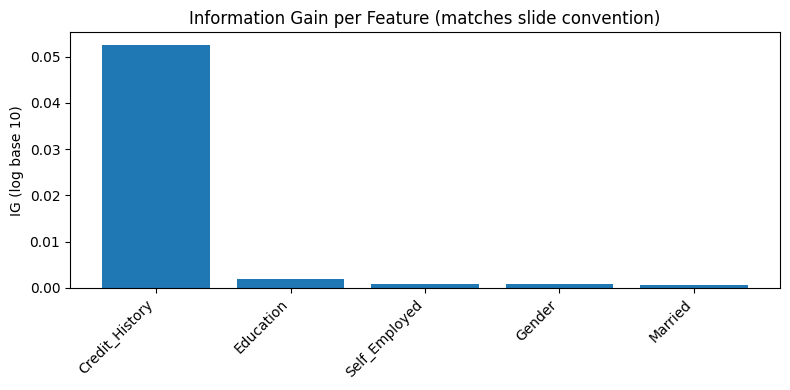

       feature  rows_used  IG_base10
Credit_History        299   0.052591
     Education        299   0.002017
 Self_Employed        299   0.000916
        Gender        299   0.000840
       Married        299   0.000660


In [ ]:
# Plot bar (base-10 IG)
plt.figure(figsize=(8,4))
plt.bar(ig_table["feature"], ig_table["IG_base10"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("IG (log base 10)")
plt.title("Information Gain per Feature (matches slide convention)")
plt.tight_layout()
plt.show()

# Print numeric values for quick eyeballing
print(ig_table.to_string(index=False))

In [ ]:
# # Step 1: Get root feature from your existing ig_table
# root_feature = ig_table.loc[0, "feature"]
# print(f"🟩 Root feature: {root_feature}")

# # Step 2: Get unique values in the root feature (excluding NaNs)
# root_values = df_clean[root_feature].dropna().unique()

# # Step 3: For each value of root feature, compute IG for remaining features
# for root_val in sorted(root_values):
#     # Filter dataset where root feature == current value
#     sub_df = df_clean[df_clean[root_feature] == root_val]

#     print(f"\n📂 Subtree for {root_feature} = {root_val} ({len(sub_df)} rows)")

#     # Compute IG for remaining features (excluding root)
#     child_results = []
#     for feat in feature_cols:
#         if feat == root_feature:
#             continue  # skip root itself
#         try:
#             details, wH, parent_H, n_used = split_details_for_feature(sub_df, feat, target_col)
#             ig = parent_H - wH
#             child_results.append({
#                 "feature": feat,
#                 "IG_base10": ig,
#                 "rows_used": n_used
#             })
#         except Exception as e:
#             print(f"Skipped feature {feat}: {e}")

#     # Convert to DataFrame
#     child_ig_table = pd.DataFrame(child_results).sort_values("IG_base10", ascending=False).reset_index(drop=True)

#     # Display the results
#     display(child_ig_table)

#     # Show best next feature at this branch
#     if not child_ig_table.empty:
#         best_feature = child_ig_table.loc[0, "feature"]
#         best_ig = child_ig_table.loc[0, "IG_base10"]
#         print(f"➡️ Best next feature at {root_feature} = {root_val}: {best_feature} (IG = {best_ig:.4f})")
#     else:
#         print("⚠️ No valid features to split further at this node.")


🟩 Root feature: Credit_History

📂 Subtree for Credit_History = 0.0 (43 rows)
child_entropy:  0.17499520825221648
child_entropy:  -0.0
child_entropy:  0.1956762467702946
child_entropy:  -0.0
child_entropy:  0.15149585433537502
child_entropy:  0.15730604625102798
child_entropy:  0.2023809058691963
child_entropy:  0.11777604826287537


,feature,IG_base10,rows_used
0,Education,0.019587,43
1,Self_Employed,0.009597,43
2,Married,0.004881,43
3,Gender,0.000015,43


➡️ Best next feature at Credit_History = 0.0: Education (IG = 0.0196)

📂 Subtree for Credit_History = 1.0 (256 rows)
child_entropy:  0.22511208459994933
child_entropy:  0.24799201240394408
child_entropy:  0.2246732571320995
child_entropy:  0.24175447302748684
child_entropy:  0.2544759887859944
child_entropy:  0.22178927085640607
child_entropy:  0.2481580968228007
child_entropy:  0.21587214182510117


,feature,IG_base10,rows_used
0,Married,0.001048,256
1,Gender,0.000737,256
2,Self_Employed,0.000261,256
3,Education,0.000201,256


➡️ Best next feature at Credit_History = 1.0: Married (IG = 0.0010)


In [ ]:
# # Step 1: Root feature already calculated from ig_table
# root_feature = ig_table.loc[0, "feature"]
# print(f"🟩 Root feature: {root_feature}\n")

# # Step 2: Get values of the root feature (e.g., 0 and 1 for Credit_History)
# root_values = sorted(df_clean[root_feature].dropna().unique())

# # Helper to print indent tree structure
# def print_node(level, label):
#     indent = "   " * level
#     print(f"{indent}└── {label}")

# # Step 3: Traverse each root value (first level of split)
# for val1 in root_values:
#     subset_lvl1 = df_clean[df_clean[root_feature] == val1]

#     print_node(0, f"{root_feature} = {val1} ({len(subset_lvl1)} rows)")

#     # Find best next feature (exclude used root)
#     level1_results = []
#     for feat in feature_cols:
#         if feat == root_feature:
#             continue
#         try:
#             details, wH, parent_H, n_used = split_details_for_feature(subset_lvl1, feat, target_col)
#             ig = parent_H - wH
#             level1_results.append({"feature": feat, "IG": ig})
#         except:
#             continue

#     level1_df = pd.DataFrame(level1_results).sort_values("IG", ascending=False).reset_index(drop=True)

#     if level1_df.empty:
#         print_node(1, "No further split (leaf)")
#         continue

#     # Select best feature at this level
#     best_lvl1_feat = level1_df.loc[0, "feature"]
#     print_node(1, f"Split on {best_lvl1_feat} (IG = {level1_df.loc[0, 'IG']:.4f})")

#     # Step 4: Grandchild level (split by best_lvl1_feat values)
#     child_values = sorted(subset_lvl1[best_lvl1_feat].dropna().unique())
#     for val2 in child_values:
#         subset_lvl2 = subset_lvl1[subset_lvl1[best_lvl1_feat] == val2]

#         print_node(2, f"{best_lvl1_feat} = {val2} ({len(subset_lvl2)} rows)")

#         # Optional: calculate next best split again if you want a deeper tree
#         # For now, stop at level 3


🟩 Root feature: Credit_History

└── Credit_History = 0.0 (43 rows)
child_entropy:  0.17499520825221648
child_entropy:  -0.0
child_entropy:  0.1956762467702946
child_entropy:  -0.0
child_entropy:  0.15149585433537502
child_entropy:  0.15730604625102798
child_entropy:  0.2023809058691963
child_entropy:  0.11777604826287537
   └── Split on Education (IG = 0.0196)
      └── Education = Graduate (30 rows)
      └── Education = Not Graduate (13 rows)
└── Credit_History = 1.0 (256 rows)
child_entropy:  0.22511208459994933
child_entropy:  0.24799201240394408
child_entropy:  0.2246732571320995
child_entropy:  0.24175447302748684
child_entropy:  0.2544759887859944
child_entropy:  0.22178927085640607
child_entropy:  0.2481580968228007
child_entropy:  0.21587214182510117
   └── Split on Married (IG = 0.0010)
      └── Married = No (89 rows)
      └── Married = Yes (167 rows)


In [ ]:
!apt-get install graphviz graphviz-dev
!pip install pygraphviz


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Note, selecting 'libgraphviz-dev' instead of 'graphviz-dev'
graphviz is already the newest version (2.42.2-6ubuntu0.1).
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk librsvg2-common libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk librsvg2-common libxdot4
0 upgraded, 9 newly installed, 0 to remove and 35 not upgraded.
Need to get 2,434 kB of archives.
After this operation, 7,681 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libgtk2.0-common all 2.24.33-2ubuntu2.1 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 libgtk2.0-0 amd64 2.24.33-2ubuntu2.1 [2,038 kB]
Get:3 http://a

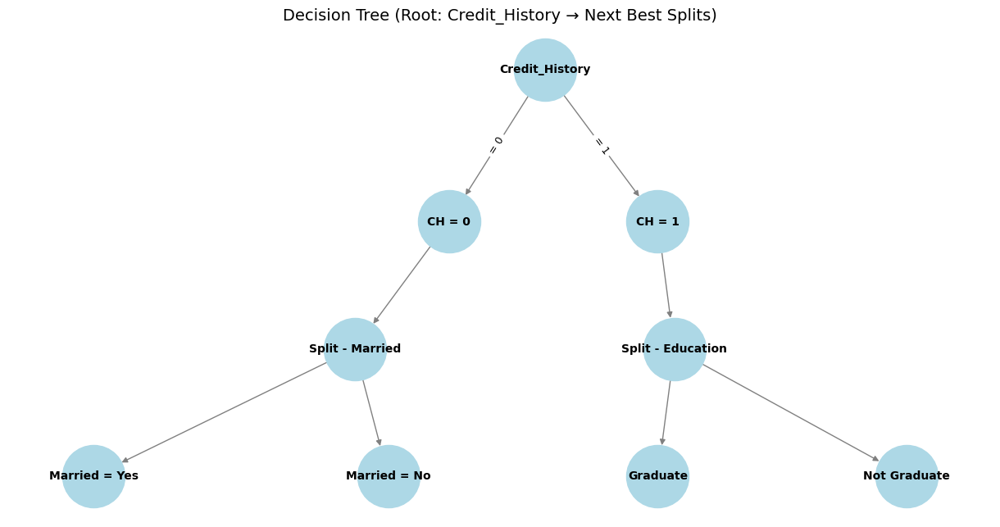

In [ ]:
# Re-import after kernel reset
import matplotlib.pyplot as plt
import networkx as nx
# Fix the issue by replacing ":" with "-" in node names for compatibility with graphviz_layout
G = nx.DiGraph()

# Level 0 (root)
G.add_node("Credit_History")

# Level 1 splits (root values)
G.add_node("CH = 0")
G.add_node("CH = 1")
G.add_edge("Credit_History", "CH = 0", label="= 0")
G.add_edge("Credit_History", "CH = 1", label="= 1")

# Level 2 splits
G.add_node("Split - Married")
G.add_node("Split - Education")
G.add_edge("CH = 0", "Split - Married")
G.add_edge("CH = 1", "Split - Education")

# Level 3 leaves
G.add_node("Married = Yes")
G.add_node("Married = No")
G.add_edge("Split - Married", "Married = Yes")
G.add_edge("Split - Married", "Married = No")

G.add_node("Graduate")
G.add_node("Not Graduate")
G.add_edge("Split - Education", "Graduate")
G.add_edge("Split - Education", "Not Graduate")

# Use a tree layout left-to-right
pos = nx.nx_agraph.graphviz_layout(G, prog='dot')

# Draw the graph
plt.figure(figsize=(12, 6))
nx.draw(G, pos, with_labels=True, arrows=True,
        node_color='lightblue', node_size=3000,
        font_size=10, font_weight='bold', edge_color='gray')

# Edge labels like (= 0), (= 1)
edge_labels = nx.get_edge_attributes(G, 'label')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=9)

plt.title("Decision Tree (Root: Credit_History → Next Best Splits)", fontsize=14)
plt.axis('off')
plt.show()


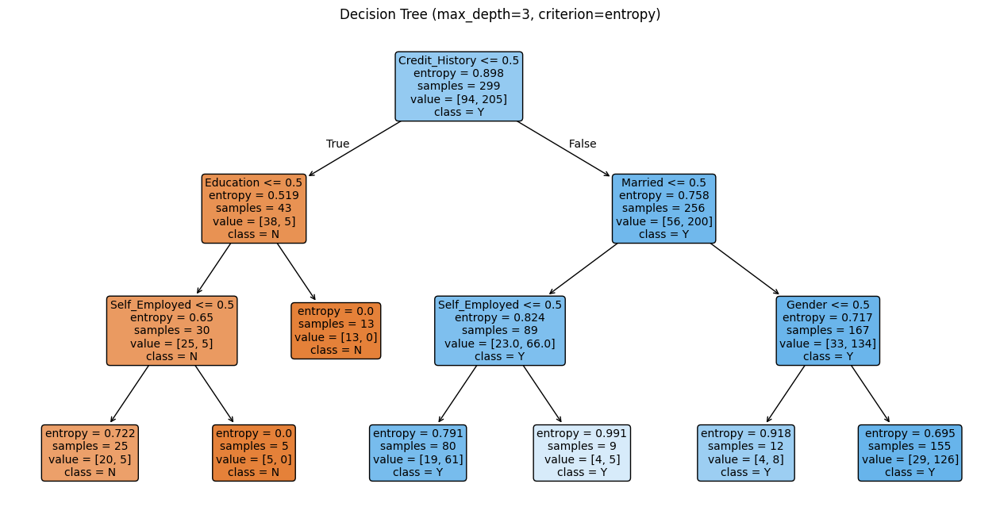

In [ ]:
# Re-import required modules after state reset
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import LabelEncoder

# Load the CSV file again after reset
df = pd.read_csv("Loan_1.csv")

# Target and feature columns
target_col = "Loan_Status"
feature_cols = ["Self_Employed", "Credit_History", "Education", "Gender", "Married"]

# Clean: drop NaNs in target + selected features
df_clean = df.dropna(subset=[target_col] + feature_cols).copy()

# Encode categorical variables
df_enc = df_clean.copy()
label_encoders = {}
for col in df_enc.columns:
    if df_enc[col].dtype == 'object' or df_enc[col].dtype.name == 'category':
        le = LabelEncoder()
        df_enc[col] = le.fit_transform(df_enc[col].astype(str))
        label_encoders[col] = le

# Separate X and y
X = df_enc[feature_cols]
y = df_enc[target_col]

# Train decision tree
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)
clf.fit(X, y)

# Plot the decision tree
plt.figure(figsize=(16, 8))
plot_tree(
    clf,
    feature_names=feature_cols,
    class_names=label_encoders[target_col].classes_ if target_col in label_encoders else ["0", "1"],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree (max_depth=3, criterion=entropy)")
plt.show()


Decision Trees are prone to Overfitting.

**Pruning** is the method that attempts to prevent **Overfitting** by preventing the Tree to grow too complex or have many different levels.
- Sign of **Overfitting** is that the model performs very well on training data, but show similar level of performance on unseen data.

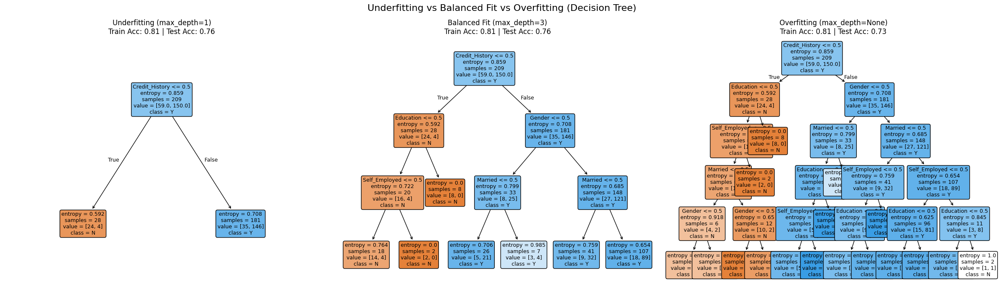

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define 3 models: underfit (depth=1), perfect fit (depth=None), overfit (depth=10+)
models = {
    "Underfitting (max_depth=1)": DecisionTreeClassifier(criterion="entropy", max_depth=1, random_state=42),
    "Balanced Fit (max_depth=3)": DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=42),
    "Overfitting (max_depth=None)": DecisionTreeClassifier(criterion="entropy", max_depth=None, random_state=42)
}

# Train and collect results
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
for ax, (title, model) in zip(axes, models.items()):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    train_acc = accuracy_score(y_train, y_pred_train)
    test_acc = accuracy_score(y_test, y_pred_test)

    plot_tree(
        model,
        feature_names=feature_cols,
        class_names=label_encoders[target_col].classes_ if target_col in label_encoders else ["0", "1"],
        filled=True,
        rounded=True,
        fontsize=9,
        ax=ax
    )
    ax.set_title(f"{title}\nTrain Acc: {train_acc:.2f} | Test Acc: {test_acc:.2f}")

plt.suptitle("Underfitting vs Balanced Fit vs Overfitting (Decision Tree)", fontsize=16)
plt.tight_layout()
plt.show()

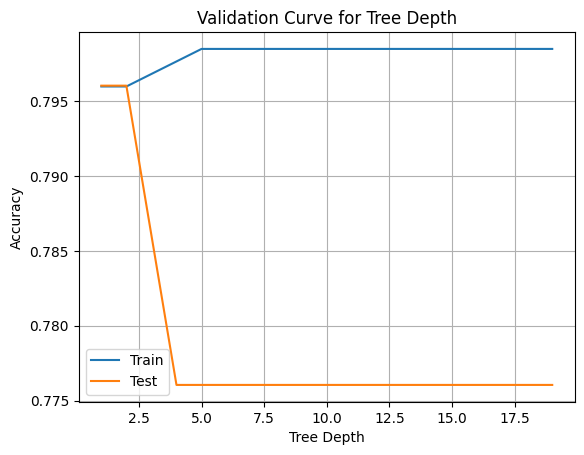

In [ ]:
from sklearn.model_selection import validation_curve

depth_range = range(1, 20)
train_scores, test_scores = validation_curve(
    DecisionTreeClassifier(criterion="entropy"),
    X, y,
    param_name="max_depth",
    param_range=depth_range,
    cv=5,
    scoring="accuracy"
)

train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

plt.plot(depth_range, train_mean, label="Train")
plt.plot(depth_range, test_mean, label="Test")
plt.xlabel("Tree Depth")
plt.ylabel("Accuracy")
plt.title("Validation Curve for Tree Depth")
plt.legend()
plt.grid(True)
plt.show()


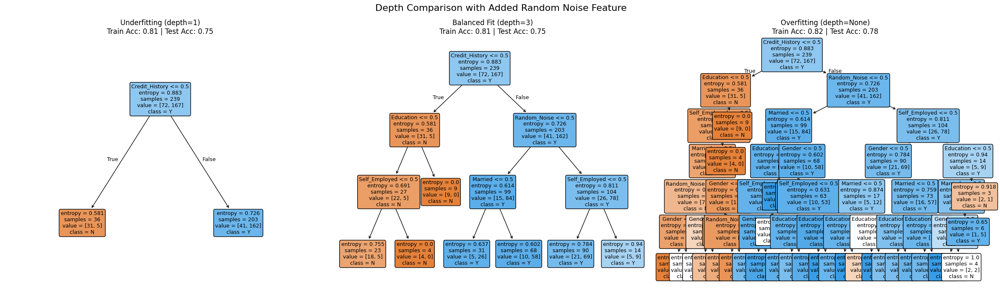

In [ ]:
# Add a noisy synthetic feature to simulate overfitting behavior
np.random.seed(42)
df_clean["Random_Noise"] = np.random.randint(0, 2, size=len(df_clean))

# Add the new feature to the list
feature_cols_with_noise = feature_cols + ["Random_Noise"]

# Re-encode the updated dataframe
df_enc = df_clean.copy()
label_encoders = {}
for col in df_enc.columns:
    if df_enc[col].dtype == 'object' or df_enc[col].dtype.name == 'category':
        le = LabelEncoder()
        df_enc[col] = le.fit_transform(df_enc[col].astype(str))
        label_encoders[col] = le

# Redefine X and y with the noisy feature
X = df_enc[feature_cols_with_noise]
y = df_enc[target_col]

# Split again
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=32)

# Retrain models for 3 depths
models = {
    "Underfitting (depth=1)": DecisionTreeClassifier(criterion="entropy", max_depth=1, random_state=42),
    "Balanced Fit (depth=3)": DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=42),
    "Overfitting (depth=None)": DecisionTreeClassifier(criterion="entropy", max_depth=None, random_state=42)
}

# Plot the updated trees with the new noisy feature
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
for ax, (title, model) in zip(axes, models.items()):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    train_acc = accuracy_score(y_train, y_pred_train)
    test_acc = accuracy_score(y_test, y_pred_test)

    plot_tree(
        model,
        feature_names=feature_cols_with_noise,
        class_names=label_encoders[target_col].classes_ if target_col in label_encoders else ["0", "1"],
        filled=True,
        rounded=True,
        fontsize=9,
        ax=ax
    )
    ax.set_title(f"{title}\nTrain Acc: {train_acc:.2f} | Test Acc: {test_acc:.2f}")

plt.suptitle("Depth Comparison with Added Random Noise Feature", fontsize=16)
plt.tight_layout()
plt.show()


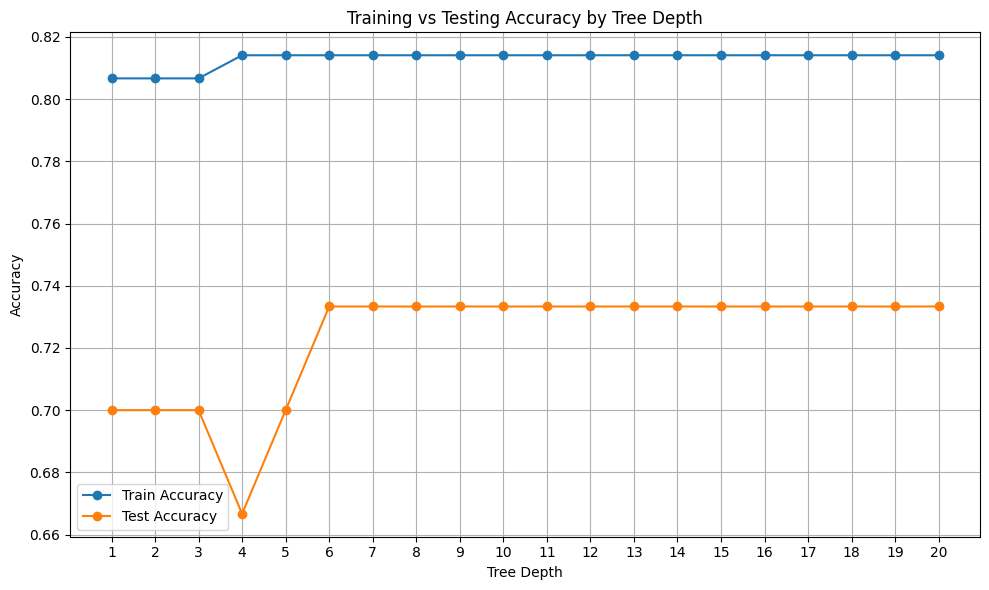

In [ ]:
# Evaluate train/test accuracy across a range of tree depths
from sklearn.model_selection import cross_val_score

max_depths = list(range(1, 21))
train_accuracies = []
test_accuracies = []

for depth in max_depths:
    model = DecisionTreeClassifier(criterion="entropy", max_depth=depth, random_state=42)
    model.fit(X_train, y_train)

    train_acc = accuracy_score(y_train, model.predict(X_train))
    test_acc = accuracy_score(y_test, model.predict(X_test))

    train_accuracies.append(train_acc)
    test_accuracies.append(test_acc)

# Plot accuracy vs depth
plt.figure(figsize=(10, 6))
plt.plot(max_depths, train_accuracies, marker='o', label='Train Accuracy')
plt.plot(max_depths, test_accuracies, marker='o', label='Test Accuracy')
plt.xlabel("Tree Depth")
plt.ylabel("Accuracy")
plt.title("Training vs Testing Accuracy by Tree Depth")
plt.legend()
plt.grid(True)
plt.xticks(max_depths)
plt.tight_layout()
plt.show()


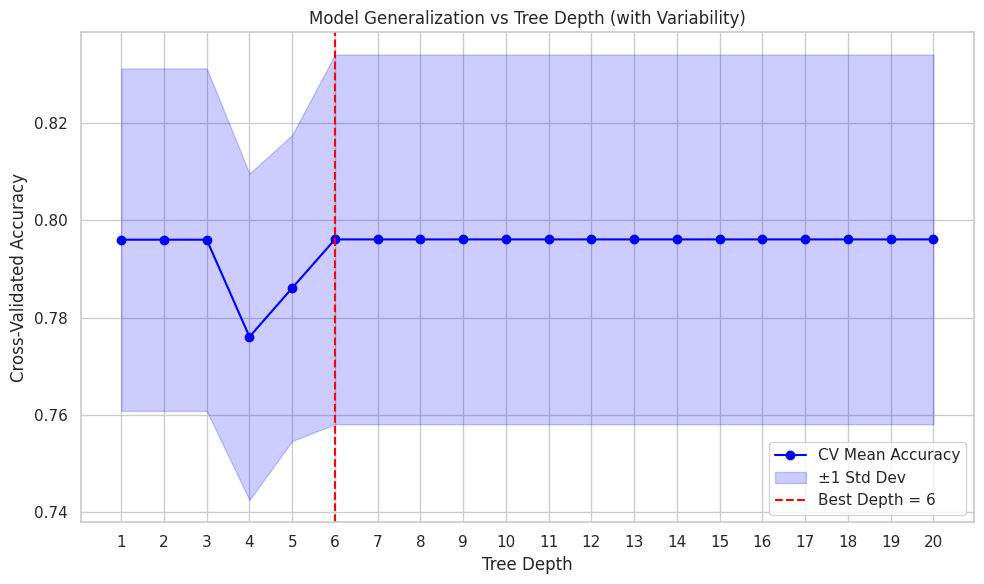

In [ ]:
from sklearn.model_selection import cross_val_score
import seaborn as sns

# Set up lists to store cross-validated accuracy scores
cv_mean_scores = []
cv_std_scores = []
depth_range = list(range(1, 21))

# For each depth, compute mean and std dev of accuracy using 5-fold CV
for depth in depth_range:
    model = DecisionTreeClassifier(criterion="entropy", max_depth=depth, random_state=42)
    scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    cv_mean_scores.append(scores.mean())
    cv_std_scores.append(scores.std())

# Plot with error bars to show variability
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

# Plot mean CV accuracy with shaded area for ±1 std
plt.plot(depth_range, cv_mean_scores, label="CV Mean Accuracy", marker='o', color='blue')
plt.fill_between(
    depth_range,
    np.array(cv_mean_scores) - np.array(cv_std_scores),
    np.array(cv_mean_scores) + np.array(cv_std_scores),
    color='blue', alpha=0.2, label='±1 Std Dev'
)

# Highlight the best depth
best_cv_score = max(cv_mean_scores)
best_cv_depth = depth_range[cv_mean_scores.index(best_cv_score)]
plt.axvline(x=best_cv_depth, linestyle='--', color='red', label=f"Best Depth = {best_cv_depth}")

# Labels and title
plt.xlabel("Tree Depth")
plt.ylabel("Cross-Validated Accuracy")
plt.title("Model Generalization vs Tree Depth (with Variability)")
plt.legend()
plt.xticks(depth_range)
plt.tight_layout()
plt.show()


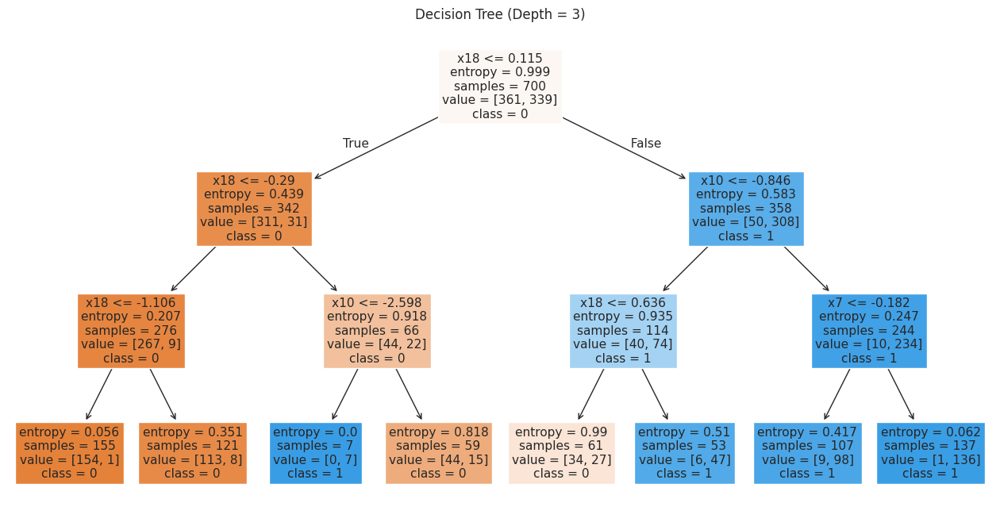

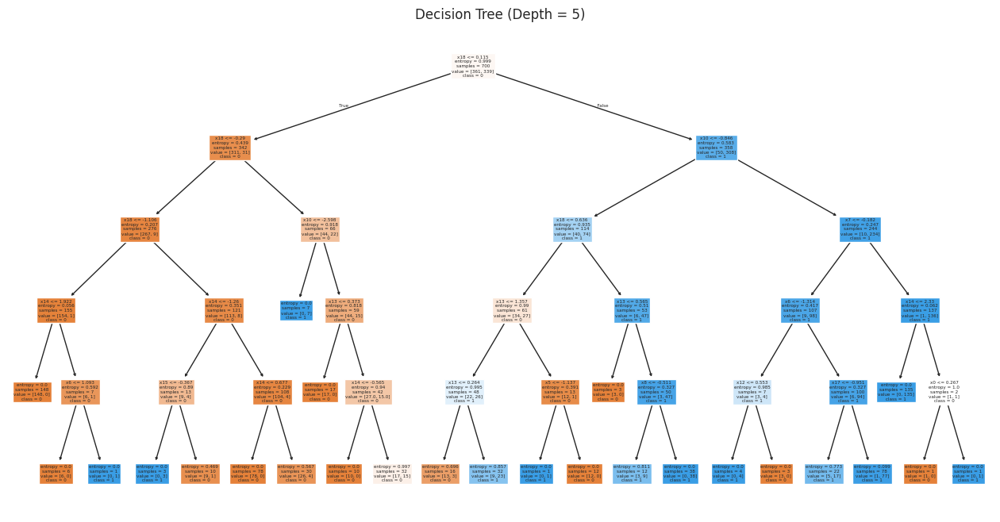

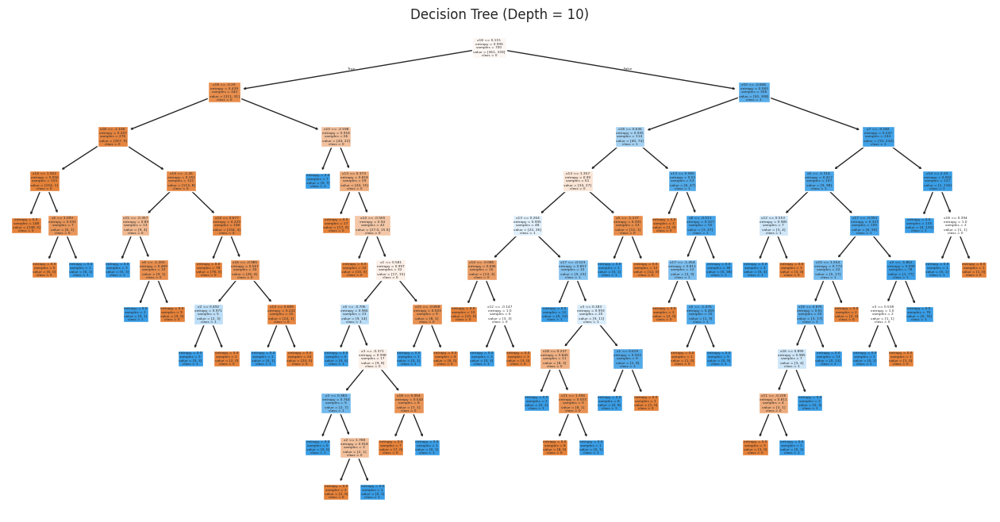

In [ ]:
# Re-import make_classification (name was lost after kernel reset)
from sklearn.datasets import make_classification

# Rerun dataset generation so everything is restored
X_synth, y_synth = make_classification(
    n_samples=1000,
    n_features=20,
    n_informative=3,
    n_redundant=0,
    n_repeated=0,
    n_classes=2,
    flip_y=0.05,
    class_sep=1.0,
    random_state=42
)

# Train/test split
X_train_syn, X_test_syn, y_train_syn, y_test_syn = train_test_split(X_synth, y_synth, test_size=0.3, random_state=42)

# Train decision trees again for depths 3, 5, and 10
depths_to_plot = [3, 5, 10]
trees = {}
for depth in depths_to_plot:
    clf = DecisionTreeClassifier(max_depth=depth, criterion="entropy", random_state=42)
    clf.fit(X_train_syn, y_train_syn)
    trees[depth] = clf

# Plot the trees again
figs = []
for depth in depths_to_plot:
    fig, ax = plt.subplots(figsize=(16, 8))
    plot_tree(
        trees[depth],
        filled=True,
        feature_names=[f"x{i}" for i in range(X_train_syn.shape[1])],
        class_names=["0", "1"],
        max_depth=depth,
        ax=ax
    )
    ax.set_title(f"Decision Tree (Depth = {depth})")
    figs.append(fig)


🌳 Depth = 3: Compact, easy to interpret.

Captures the main signal in the data.

Good balance between simplicity and performance.

🌳 Depth = 5: More detailed decision boundaries.

Still maintains generalization, but begins to fragment.

Complexity starts to rise.

🌳 Depth = 10: Highly complex, overfit likely.

Captures many small patterns (possibly noise).

Not ideal for generalization.

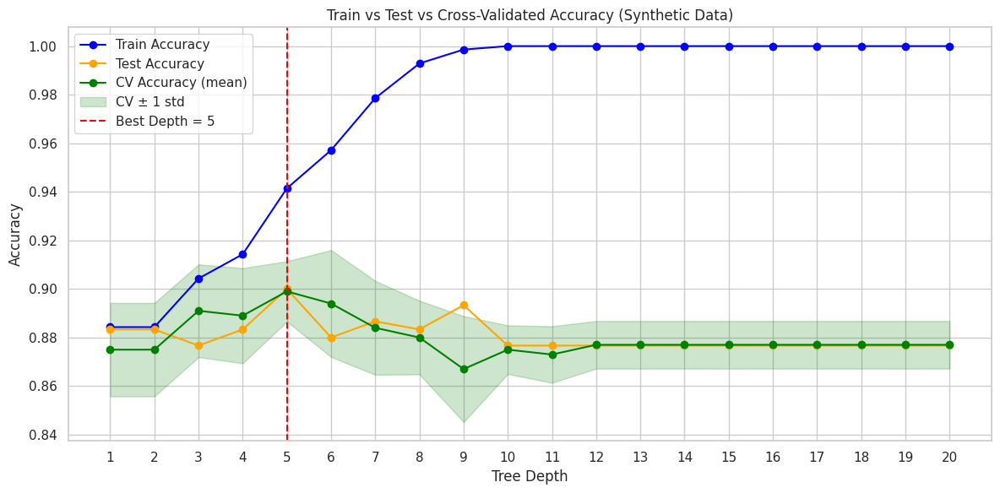

In [ ]:
# Create a fully synthetic dataset with known structure
X_synth, y_synth = make_classification(
    n_samples=1000,
    n_features=20,
    n_informative=3,        # only 3 features are informative
    n_redundant=0,
    n_repeated=0,
    n_classes=2,
    flip_y=0.05,            # add a bit of noise to labels
    class_sep=1.0,
    random_state=42
)

# Split into train/test
X_train_syn, X_test_syn, y_train_syn, y_test_syn = train_test_split(
    X_synth, y_synth, test_size=0.3, random_state=42
)

# Compute training and test accuracy across depths
depths = list(range(1, 21))
train_accs, test_accs = [], []

for depth in depths:
    clf = DecisionTreeClassifier(max_depth=depth, criterion="entropy", random_state=42)
    clf.fit(X_train_syn, y_train_syn)
    train_accs.append(accuracy_score(y_train_syn, clf.predict(X_train_syn)))
    test_accs.append(accuracy_score(y_test_syn, clf.predict(X_test_syn)))

# Also compute cross-validation stats
cv_means = []
cv_stds = []

for depth in depths:
    clf = DecisionTreeClassifier(max_depth=depth, criterion="entropy", random_state=42)
    scores = cross_val_score(clf, X_synth, y_synth, cv=5, scoring='accuracy')
    cv_means.append(scores.mean())
    cv_stds.append(scores.std())

# Plot all 3: Train, Test, CV (mean ± std)
plt.figure(figsize=(12, 6))
plt.plot(depths, train_accs, label="Train Accuracy", marker='o', color='blue')
plt.plot(depths, test_accs, label="Test Accuracy", marker='o', color='orange')
plt.plot(depths, cv_means, label="CV Accuracy (mean)", marker='o', color='green')
plt.fill_between(
    depths,
    np.array(cv_means) - np.array(cv_stds),
    np.array(cv_means) + np.array(cv_stds),
    color='green',
    alpha=0.2,
    label="CV ± 1 std"
)

# Mark best test accuracy
best_test_depth = depths[np.argmax(test_accs)]
plt.axvline(x=best_test_depth, color='red', linestyle='--', label=f"Best Depth = {best_test_depth}")

plt.xlabel("Tree Depth")
plt.ylabel("Accuracy")
plt.title("Train vs Test vs Cross-Validated Accuracy (Synthetic Data)")
plt.legend()
plt.grid(True)
plt.xticks(depths)
plt.tight_layout()
plt.show()


Training Accuracy (blue): Increases steadily and hits 100% by depth ~9 → shows how trees can memorize data.

Test Accuracy (orange):

Peaks at depth = 5

Then drops — classic overfitting due to noise

Cross-Validation Accuracy (green):

Closely follows the test curve

±1 std band helps show variability and model stability

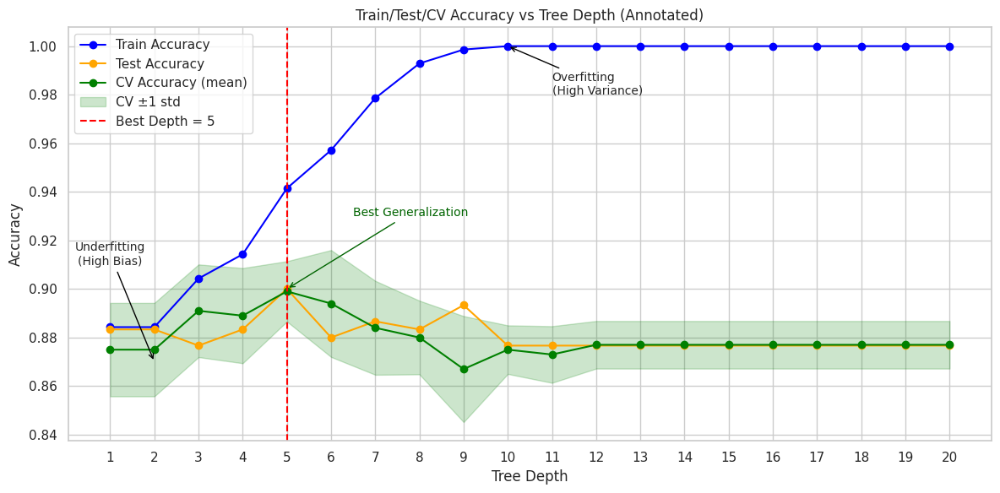

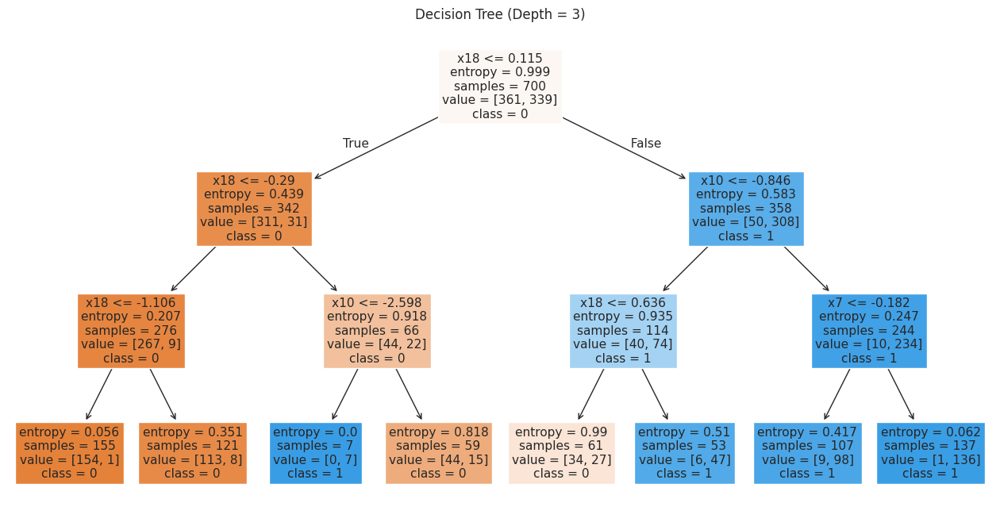

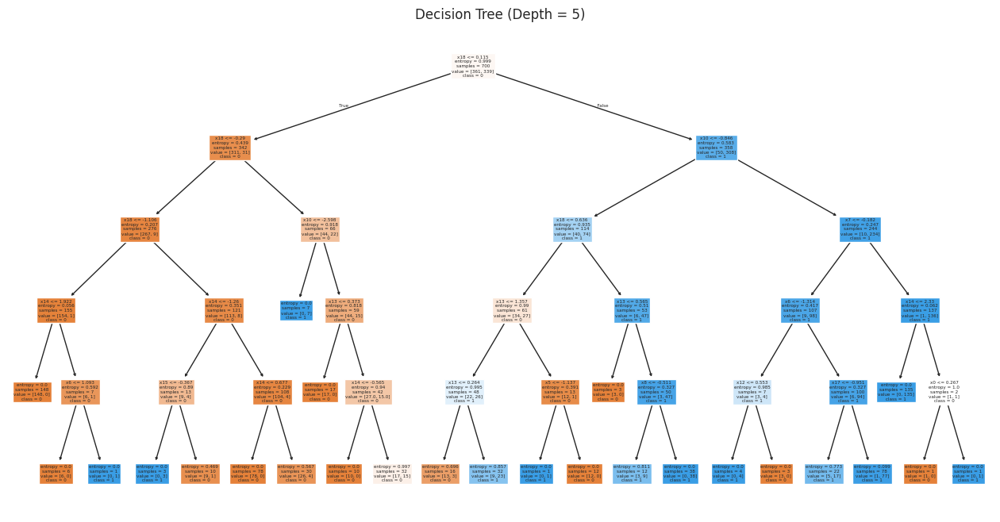

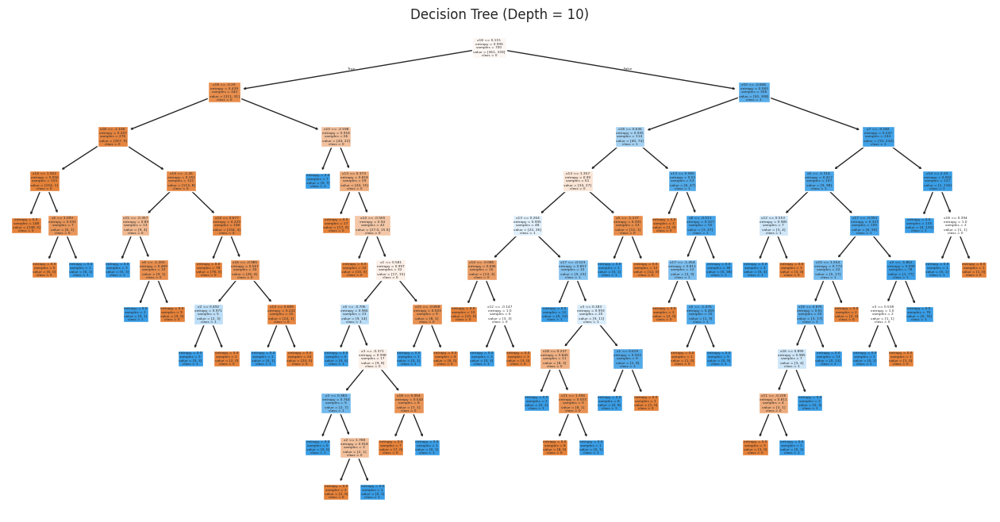

In [ ]:
# from sklearn.tree import plot_tree

# # 1. Plot with annotations for bias, variance, and generalization
# plt.figure(figsize=(12, 6))
# plt.plot(depths, train_accs, marker='o', label='Train Accuracy', color='blue')
# plt.plot(depths, test_accs, marker='o', label='Test Accuracy', color='orange')
# plt.plot(depths, cv_means, marker='o', label='CV Accuracy (mean)', color='green')
# plt.fill_between(
#     depths,
#     np.array(cv_means) - np.array(cv_stds),
#     np.array(cv_means) + np.array(cv_stds),
#     alpha=0.2, color='green', label='CV ±1 std'
# )

# # Mark regions
# plt.axvline(x=5, linestyle='--', color='red', label="Best Depth = 5")
# plt.annotate('Underfitting\n(High Bias)', xy=(2, 0.87), xytext=(1, 0.91),
#              arrowprops=dict(arrowstyle='->', color='black'), fontsize=10, ha='center')
# plt.annotate('Best Generalization', xy=(5, test_accs[4]), xytext=(6.5, 0.93),
#              arrowprops=dict(arrowstyle='->', color='darkgreen'), fontsize=10, ha='left', color='darkgreen')
# plt.annotate('Overfitting\n(High Variance)', xy=(10, train_accs[9]), xytext=(11, 0.98),
#              arrowprops=dict(arrowstyle='->', color='black'), fontsize=10, ha='left')

# plt.xlabel("Tree Depth")
# plt.ylabel("Accuracy")
# plt.title("Train/Test/CV Accuracy vs Tree Depth (Annotated)")
# plt.legend()
# plt.xticks(depths)
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# # 2. Fit and show decision trees at depths 3, 5, 10
# depths_to_plot = [3, 5, 10]
# trees = {}

# for depth in depths_to_plot:
#     clf = DecisionTreeClassifier(max_depth=depth, criterion="entropy", random_state=42)
#     clf.fit(X_train_syn, y_train_syn)
#     trees[depth] = clf

# # Create one plot per depth
# figs = []
# for depth in depths_to_plot:
#     fig, ax = plt.subplots(figsize=(16, 8))
#     plot_tree(trees[depth], filled=True, feature_names=[f"x{i}" for i in range(X_train_syn.shape[1])],
#               class_names=["0", "1"], max_depth=depth, ax=ax)
#     ax.set_title(f"Decision Tree (Depth = {depth})")
#     figs.append(fig)




**Random Forest = many decision trees working together.**

Analogy: Asking 100 doctors instead of 1 — you get a more reliable diagnosis because individual errors are averaged out.

Benefit: Better accuracy and generalization, especially on noisy data.

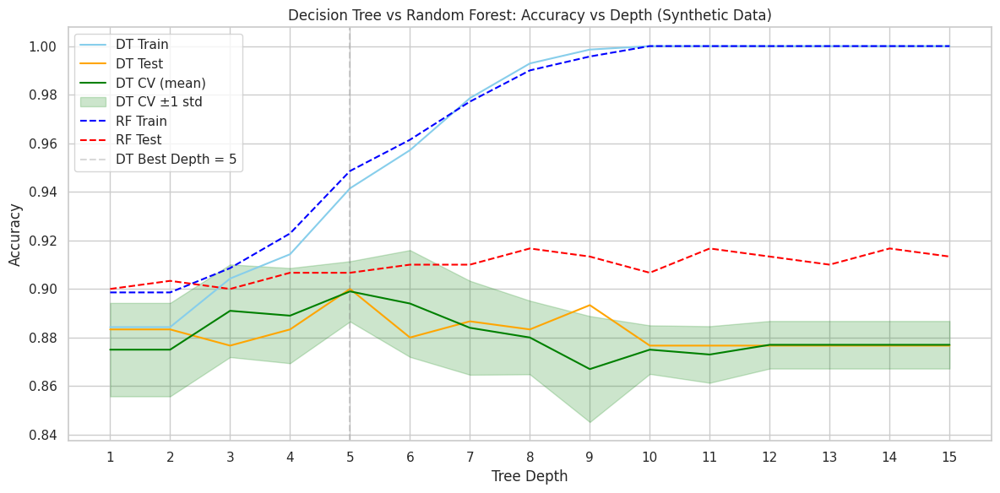

In [ ]:
# Re-run the original DT metrics to ensure same depth range (1-15)
dt_train_accs, dt_test_accs, dt_cv_means, dt_cv_stds = [], [], [], []

for depth in range(1, 16):
    clf = DecisionTreeClassifier(max_depth=depth, criterion="entropy", random_state=42)
    clf.fit(X_train_syn, y_train_syn)
    dt_train_accs.append(accuracy_score(y_train_syn, clf.predict(X_train_syn)))
    dt_test_accs.append(accuracy_score(y_test_syn, clf.predict(X_test_syn)))

    scores = cross_val_score(clf, X_synth, y_synth, cv=5, scoring='accuracy')
    dt_cv_means.append(scores.mean())
    dt_cv_stds.append(scores.std())

# Also regenerate RF metrics with same depth range
rf_train_accs, rf_test_accs = [], []

for depth in range(1, 16):
    rf = RandomForestClassifier(max_depth=depth, n_estimators=100, random_state=42)
    rf.fit(X_train_syn, y_train_syn)
    rf_train_accs.append(accuracy_score(y_train_syn, rf.predict(X_train_syn)))
    rf_test_accs.append(accuracy_score(y_test_syn, rf.predict(X_test_syn)))

# Plot comparison
plt.figure(figsize=(12, 6))
depths = list(range(1, 16))

# Decision Tree
plt.plot(depths, dt_train_accs, label="DT Train", color='skyblue', linestyle='-')
plt.plot(depths, dt_test_accs, label="DT Test", color='orange', linestyle='-')
plt.plot(depths, dt_cv_means, label="DT CV (mean)", color='green', linestyle='-')
plt.fill_between(
    depths,
    np.array(dt_cv_means) - np.array(dt_cv_stds),
    np.array(dt_cv_means) + np.array(dt_cv_stds),
    color='green', alpha=0.2, label="DT CV ±1 std"
)

# Random Forest
plt.plot(depths, rf_train_accs, label="RF Train", color='blue', linestyle='--')
plt.plot(depths, rf_test_accs, label="RF Test", color='red', linestyle='--')

# Mark best test depth (DT)
best_dt_depth = depths[np.argmax(dt_test_accs)]
plt.axvline(x=best_dt_depth, color='gray', linestyle='--', alpha=0.3, label=f"DT Best Depth = {best_dt_depth}")

plt.xlabel("Tree Depth")
plt.ylabel("Accuracy")
plt.title("Decision Tree vs Random Forest: Accuracy vs Depth (Synthetic Data)")
plt.legend()
plt.grid(True)
plt.xticks(depths)
plt.tight_layout()
plt.show()


**Depth = 8 is the best-performing depth for the Random Forest on this dataset**

RF needs a bit more depth to combine weak learners effectively.

It can afford deeper trees because it reduces overfitting via:
1. Bootstrap sampling (bagging)
2. Random feature selection
3. Majority voting

Whereas a single decision tree must be shallower (like depth 5) to avoid overfitting.

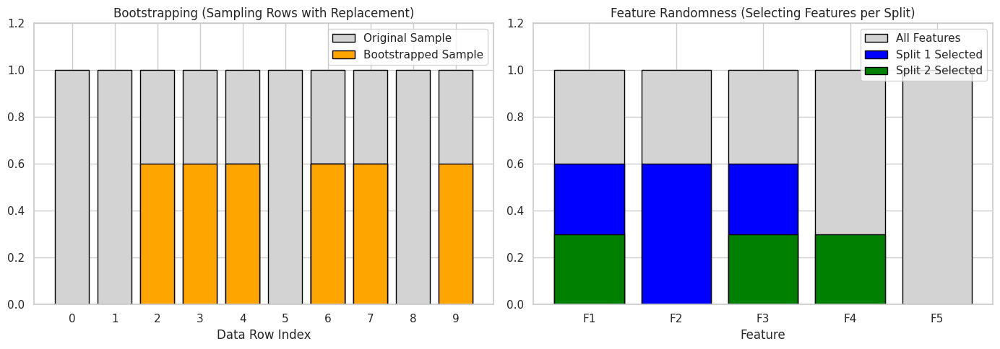

In [ ]:
import matplotlib.patches as mpatches

# Simulate bootstrapping from training data
np.random.seed(42)
full_indices = np.arange(10)
bootstrapped_indices = np.random.choice(full_indices, size=10, replace=True)

# Simulate feature selection per split
features = [f"F{i}" for i in range(1, 6)]
selected_features_split1 = np.random.choice(features, size=3, replace=False)
selected_features_split2 = np.random.choice(features, size=3, replace=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot Bootstrapping
axes[0].bar(full_indices, 1, label="Original Sample", color="lightgray", edgecolor="black")
axes[0].bar(bootstrapped_indices, 0.6, label="Bootstrapped Sample", color="orange", edgecolor="black")
axes[0].set_title("Bootstrapping (Sampling Rows with Replacement)")
axes[0].set_ylim(0, 1.2)
axes[0].set_xticks(full_indices)
axes[0].set_xlabel("Data Row Index")
axes[0].legend()

# Plot Feature Randomness
axes[1].bar(features, [1]*5, color="lightgray", edgecolor="black", label="All Features")
axes[1].bar(selected_features_split1, [0.6]*3, color="blue", edgecolor="black", label="Split 1 Selected")
axes[1].bar(selected_features_split2, [0.3]*3, color="green", edgecolor="black", label="Split 2 Selected")
axes[1].set_title("Feature Randomness (Selecting Features per Split)")
axes[1].set_ylim(0, 1.2)
axes[1].set_xlabel("Feature")
axes[1].legend()

plt.tight_layout()
plt.show()


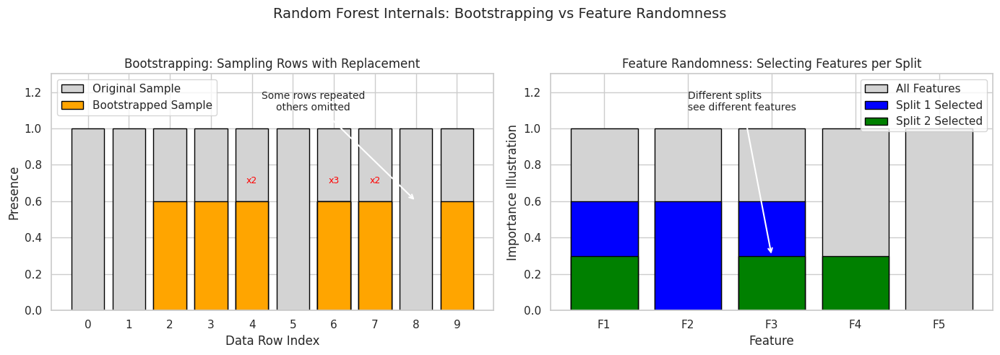

In [ ]:
# Add labeled annotations for teaching version
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bootstrapping plot with annotations
axes[0].bar(full_indices, 1, label="Original Sample", color="lightgray", edgecolor="black")
axes[0].bar(bootstrapped_indices, 0.6, label="Bootstrapped Sample", color="orange", edgecolor="black")

# Annotate duplicate points in bootstrapped set
for i in full_indices:
    count = np.sum(bootstrapped_indices == i)
    if count > 1:
        axes[0].text(i, 0.7, f"x{count}", ha='center', fontsize=9, color='red')

axes[0].set_title("Bootstrapping: Sampling Rows with Replacement")
axes[0].set_ylim(0, 1.3)
axes[0].set_xticks(full_indices)
axes[0].set_xlabel("Data Row Index")
axes[0].set_ylabel("Presence")
axes[0].legend()
axes[0].annotate("Some rows repeated\nothers omitted",
                 xy=(8, 0.6), xytext=(5.5, 1.1),
                 arrowprops=dict(arrowstyle="->", lw=1.5),
                 fontsize=10, ha='center')

# Feature randomness plot with annotations
axes[1].bar(features, [1]*5, color="lightgray", edgecolor="black", label="All Features")
axes[1].bar(selected_features_split1, [0.6]*3, color="blue", edgecolor="black", label="Split 1 Selected")
axes[1].bar(selected_features_split2, [0.3]*3, color="green", edgecolor="black", label="Split 2 Selected")

axes[1].set_title("Feature Randomness: Selecting Features per Split")
axes[1].set_ylim(0, 1.3)
axes[1].set_xlabel("Feature")
axes[1].set_ylabel("Importance Illustration")
axes[1].legend()
axes[1].annotate("Different splits\nsee different features",
                 xy=(2, 0.3), xytext=(1, 1.1),
                 arrowprops=dict(arrowstyle="->", lw=1.5),
                 fontsize=10, ha='left')

plt.suptitle("Random Forest Internals: Bootstrapping vs Feature Randomness", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
# Expand the dataset to have multiple instances per color
expanded_data = {
    "Color": ["Blue"] * 5 + ["Green"] * 5 + ["Red"] * 5 + ["Yellow"] * 5,
    "Size": np.random.choice(["Small", "Medium", "Large"], size=20),
    "Weight": np.random.choice(["Light", "Medium", "Heavy"], size=20),
    "Texture": np.random.choice(["Smooth", "Rough"], size=20),
    "Material": np.random.choice(["Plastic", "Metal", "Rubber"], size=20)
}
df_expanded = pd.DataFrame(expanded_data)

# Encode features
from sklearn.preprocessing import LabelEncoder

df_encoded = df_expanded.copy()
label_encoders = {}
for col in df_encoded.columns:
    if col != "Color":
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col])
        label_encoders[col] = le
label_target = LabelEncoder()
df_encoded["Color"] = label_target.fit_transform(df_encoded["Color"])

# Train Random Forest to classify Color based on features
X = df_encoded.drop(columns=["Color"])
y = df_encoded["Color"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)
clf = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=1)
clf.fit(X_train, y_train)

train_acc = clf.score(X_train, y_train)
test_acc = clf.score(X_test, y_test)

# Print accuracies and display sample
print(f"Random Forest Classifier Accuracy:")
print(f"Train Accuracy: {train_acc:.2f}")
print(f"Test Accuracy:  {test_acc:.2f}")

print("\n🎨 Sample of Expanded Dataset (Encoded):")
display(df_encoded.head())


Random Forest Classifier Accuracy:
Train Accuracy: 1.00
Test Accuracy:  0.17

🎨 Sample of Expanded Dataset (Encoded):


,Color,Size,Weight,Texture,Material
0,0,0,0,0,1
1,0,1,2,0,1
2,0,0,1,0,1
3,0,0,1,0,1
4,0,0,2,0,0


,Configuration,Train Accuracy,Test Accuracy
0,A: Full RF (Bootstrap + Feature Selection),0.946429,0.916667
1,B: No Bootstrapping,0.946429,0.916667
2,C: No Feature Randomness,0.946429,0.916667
3,D: No Bootstrapping or Feature Randomness,0.946429,0.791667


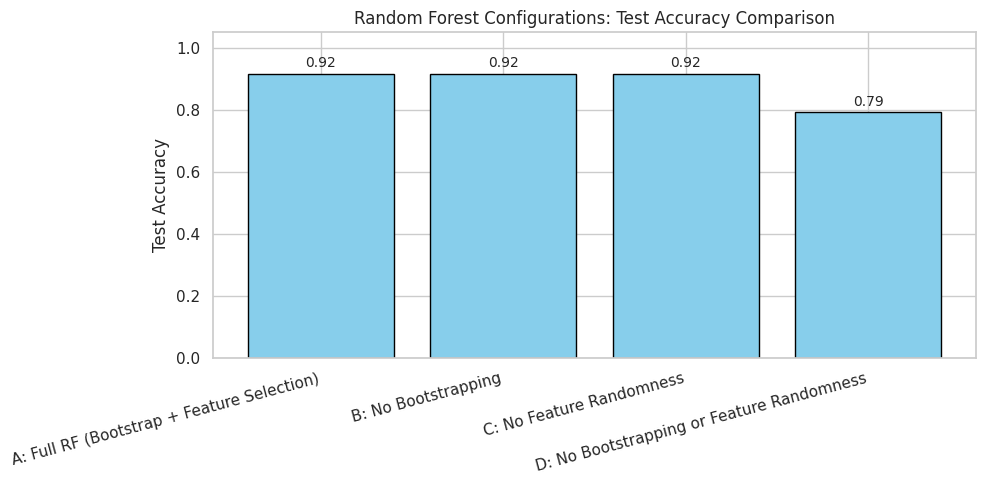

In [ ]:
# Display the results as a normal DataFrame
display(results_df)

# Plot test accuracies side-by-side
plt.figure(figsize=(10, 5))
bars = plt.bar(results_df["Configuration"], results_df["Test Accuracy"], color="skyblue", edgecolor="black")
plt.ylabel("Test Accuracy")
plt.title("Random Forest Configurations: Test Accuracy Comparison")
plt.ylim(0, 1.05)
plt.xticks(rotation=15, ha='right')

# Annotate values on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()


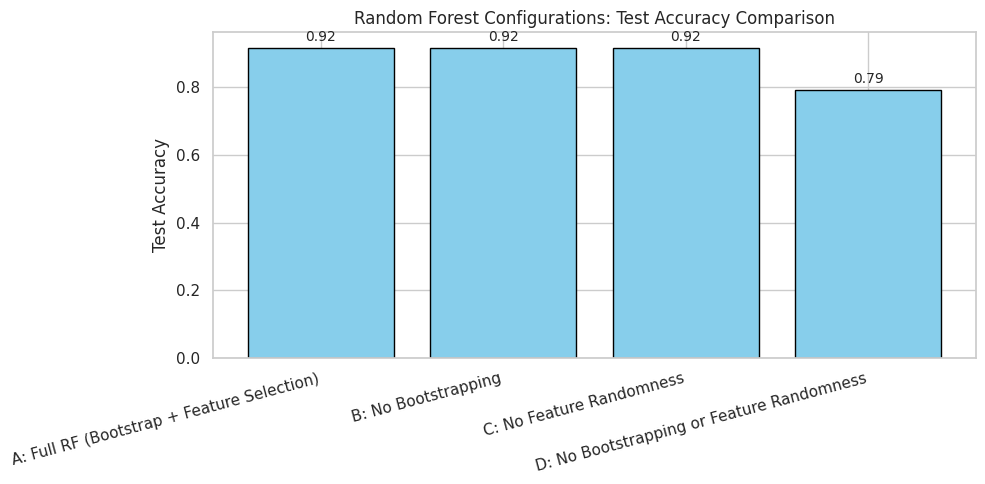

,Configuration,Train Accuracy,Test Accuracy
0,A: Full RF (Bootstrap + Feature Selection),0.946429,0.916667
1,B: No Bootstrapping,0.946429,0.916667
2,C: No Feature Randomness,0.946429,0.916667
3,D: No Bootstrapping or Feature Randomness,0.946429,0.791667


In [ ]:
# Random Forest: Bootstrapping vs Feature Randomness Explained

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# 1. Generate signal-based synthetic dataset of colored balls
def generate_color_group(color, size, weight, texture, material, n=20):
    return {
        "Color": [color] * n,
        "Size": np.random.choice([size]*3 + [np.random.choice(["Small", "Medium", "Large"])], n),
        "Weight": np.random.choice([weight]*3 + [np.random.choice(["Light", "Medium", "Heavy"])], n),
        "Texture": np.random.choice([texture]*3 + [np.random.choice(["Smooth", "Rough"])], n),
        "Material": np.random.choice([material]*3 + [np.random.choice(["Plastic", "Metal", "Rubber"])], n),
    }

np.random.seed(42)
groups = [
    generate_color_group("Blue", "Small", "Light", "Smooth", "Plastic"),
    generate_color_group("Green", "Large", "Heavy", "Rough", "Metal"),
    generate_color_group("Red", "Medium", "Medium", "Smooth", "Rubber"),
    generate_color_group("Yellow", "Small", "Light", "Rough", "Plastic")
]

df = pd.concat([pd.DataFrame(g) for g in groups], ignore_index=True)

# 2. Encode categorical variables
encoded_df = df.copy()
label_encoders = {}
for col in encoded_df.columns:
    if col != "Color":
        le = LabelEncoder()
        encoded_df[col] = le.fit_transform(encoded_df[col])
        label_encoders[col] = le

label_target = LabelEncoder()
encoded_df["Color"] = label_target.fit_transform(encoded_df["Color"])

# 3. Split the dataset
X = encoded_df.drop(columns=["Color"])
y = encoded_df["Color"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# 4. Compare 4 configurations of Random Forest
configs = {
    "A: Full RF (Bootstrap + Feature Selection)": {"bootstrap": True, "max_features": "sqrt"},
    "B: No Bootstrapping": {"bootstrap": False, "max_features": "sqrt"},
    "C: No Feature Randomness": {"bootstrap": True, "max_features": None},
    "D: No Bootstrapping or Feature Randomness": {"bootstrap": False, "max_features": None},
}

results = []
for name, params in configs.items():
    clf = RandomForestClassifier(
        n_estimators=50,
        max_depth=5,
        bootstrap=params["bootstrap"],
        max_features=params["max_features"],
        random_state=1
    )
    clf.fit(X_train, y_train)
    results.append({
        "Configuration": name,
        "Train Accuracy": clf.score(X_train, y_train),
        "Test Accuracy": clf.score(X_test, y_test)
    })

# 5. Plot the results
results_df = pd.DataFrame(results)
results_df.sort_values("Test Accuracy", ascending=False, inplace=True)

plt.figure(figsize=(10, 5))
bars = plt.bar(results_df["Configuration"], results_df["Test Accuracy"], color="skyblue", edgecolor="black")
plt.ylabel("Test Accuracy")
plt.title("Random Forest Configurations: Test Accuracy Comparison")
plt.xticks(rotation=15, ha='right')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2f}", ha='center', fontsize=10)
plt.tight_layout()
plt.show()

# Display results table
results_df.reset_index(drop=True)


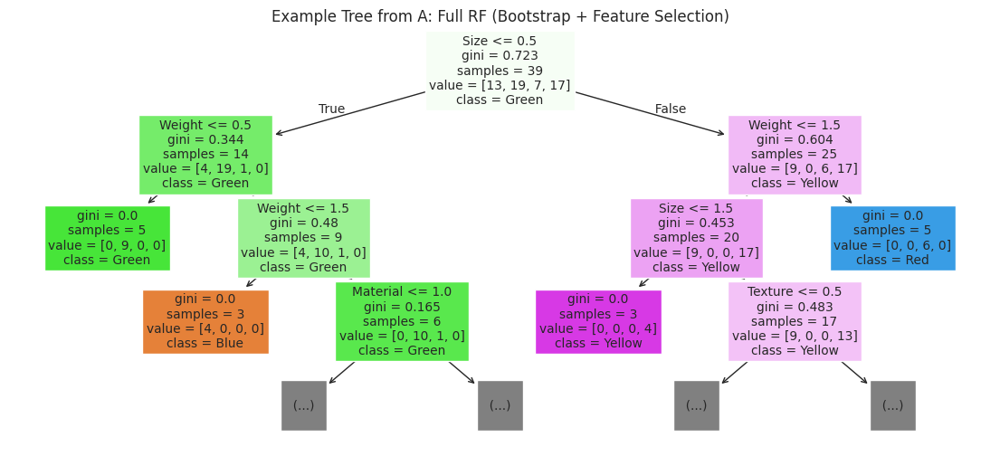

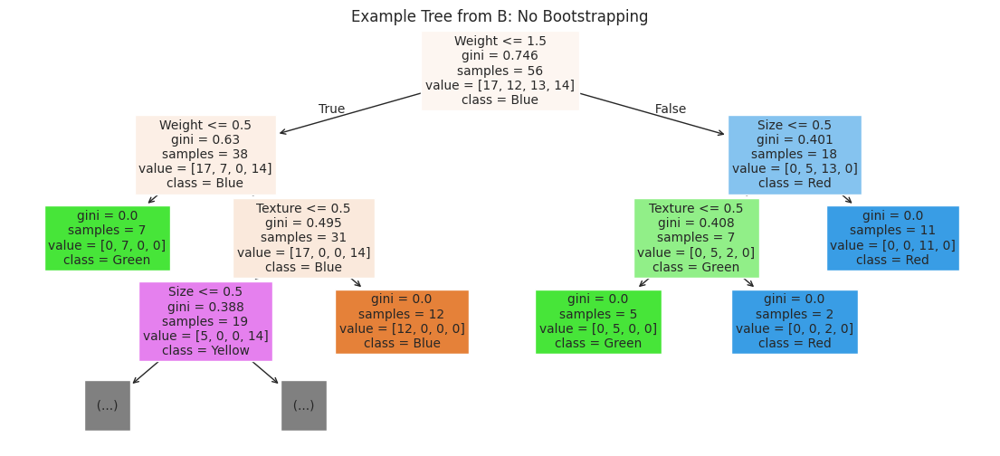

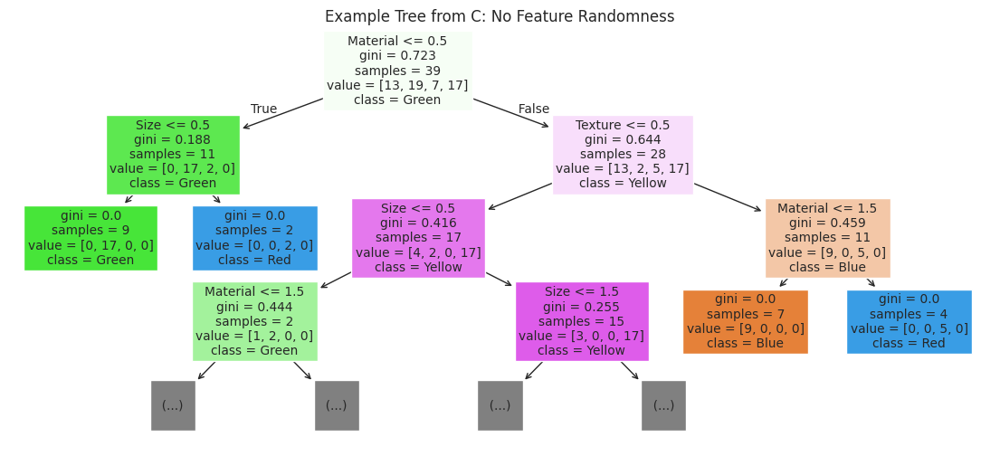

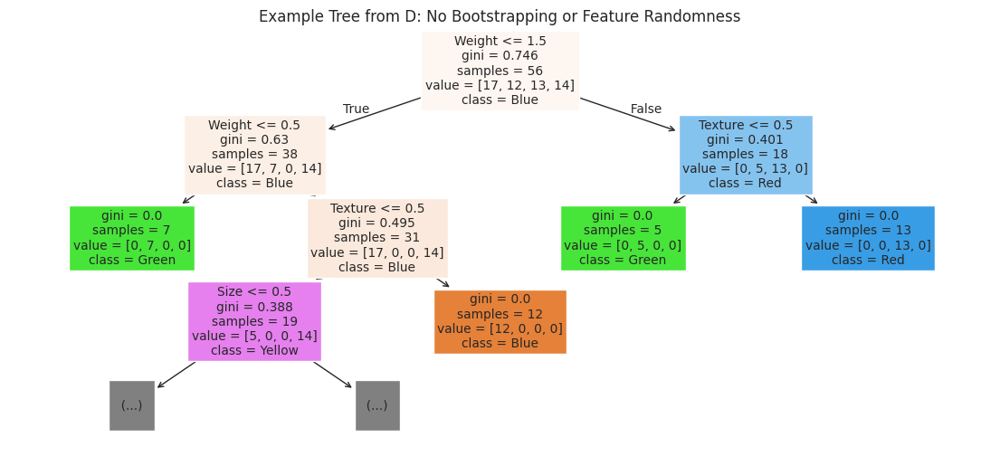

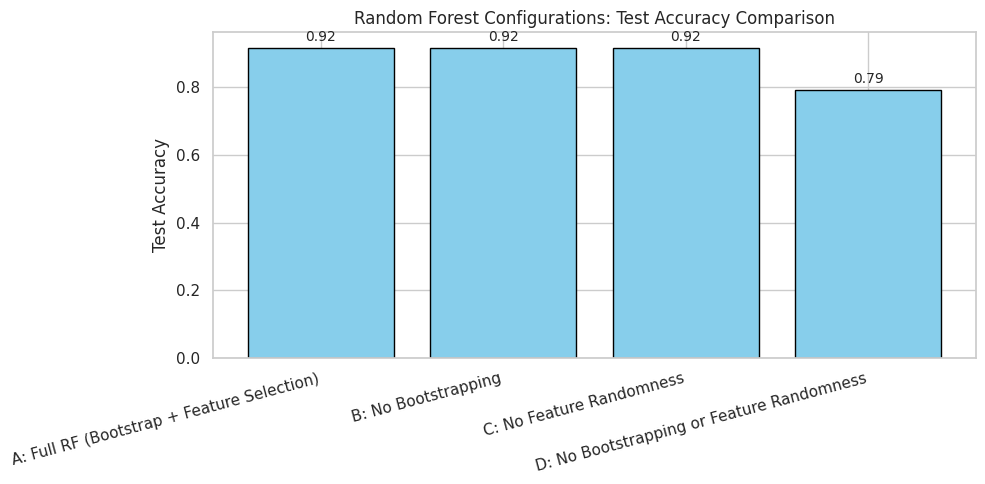

,Configuration,Train Accuracy,Test Accuracy
0,A: Full RF (Bootstrap + Feature Selection),0.946429,0.916667
1,B: No Bootstrapping,0.946429,0.916667
2,C: No Feature Randomness,0.946429,0.916667
3,D: No Bootstrapping or Feature Randomness,0.946429,0.791667


In [ ]:
# Random Forest: Bootstrapping vs Feature Randomness Explained

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# 1. Generate signal-based synthetic dataset of colored balls
def generate_color_group(color, size, weight, texture, material, n=20):
    return {
        "Color": [color] * n,
        "Size": np.random.choice([size]*3 + [np.random.choice(["Small", "Medium", "Large"])], n),
        "Weight": np.random.choice([weight]*3 + [np.random.choice(["Light", "Medium", "Heavy"])], n),
        "Texture": np.random.choice([texture]*3 + [np.random.choice(["Smooth", "Rough"])], n),
        "Material": np.random.choice([material]*3 + [np.random.choice(["Plastic", "Metal", "Rubber"])], n),
    }

np.random.seed(42)
groups = [
    generate_color_group("Blue", "Small", "Light", "Smooth", "Plastic"),
    generate_color_group("Green", "Large", "Heavy", "Rough", "Metal"),
    generate_color_group("Red", "Medium", "Medium", "Smooth", "Rubber"),
    generate_color_group("Yellow", "Small", "Light", "Rough", "Plastic")
]

df = pd.concat([pd.DataFrame(g) for g in groups], ignore_index=True)

# 2. Encode categorical variables
encoded_df = df.copy()
label_encoders = {}
for col in encoded_df.columns:
    if col != "Color":
        le = LabelEncoder()
        encoded_df[col] = le.fit_transform(encoded_df[col])
        label_encoders[col] = le

label_target = LabelEncoder()
encoded_df["Color"] = label_target.fit_transform(encoded_df["Color"])

# 3. Split the dataset
X = encoded_df.drop(columns=["Color"])
y = encoded_df["Color"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# 4. Compare 4 configurations of Random Forest
configs = {
    "A: Full RF (Bootstrap + Feature Selection)": {"bootstrap": True, "max_features": "sqrt"},
    "B: No Bootstrapping": {"bootstrap": False, "max_features": "sqrt"},
    "C: No Feature Randomness": {"bootstrap": True, "max_features": None},
    "D: No Bootstrapping or Feature Randomness": {"bootstrap": False, "max_features": None},
}

results = []
tree_visuals = []
for i, (name, params) in enumerate(configs.items()):
    clf = RandomForestClassifier(
        n_estimators=50,
        max_depth=5,
        bootstrap=params["bootstrap"],
        max_features=params["max_features"],
        random_state=1
    )
    clf.fit(X_train, y_train)
    results.append({
        "Configuration": name,
        "Train Accuracy": clf.score(X_train, y_train),
        "Test Accuracy": clf.score(X_test, y_test)
    })

    # Store a plot of the first tree in the forest
    plt.figure(figsize=(14, 6))
    plot_tree(clf.estimators_[0], feature_names=X.columns, class_names=label_target.classes_, filled=True, max_depth=3)
    plt.title(f"Example Tree from {name}")
    plt.show()

# 5. Plot the results
results_df = pd.DataFrame(results)
results_df.sort_values("Test Accuracy", ascending=False, inplace=True)

plt.figure(figsize=(10, 5))
bars = plt.bar(results_df["Configuration"], results_df["Test Accuracy"], color="skyblue", edgecolor="black")
plt.ylabel("Test Accuracy")
plt.title("Random Forest Configurations: Test Accuracy Comparison")
plt.xticks(rotation=15, ha='right')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2f}", ha='center', fontsize=10)
plt.tight_layout()
plt.show()

# Display results table
results_df.reset_index(drop=True)


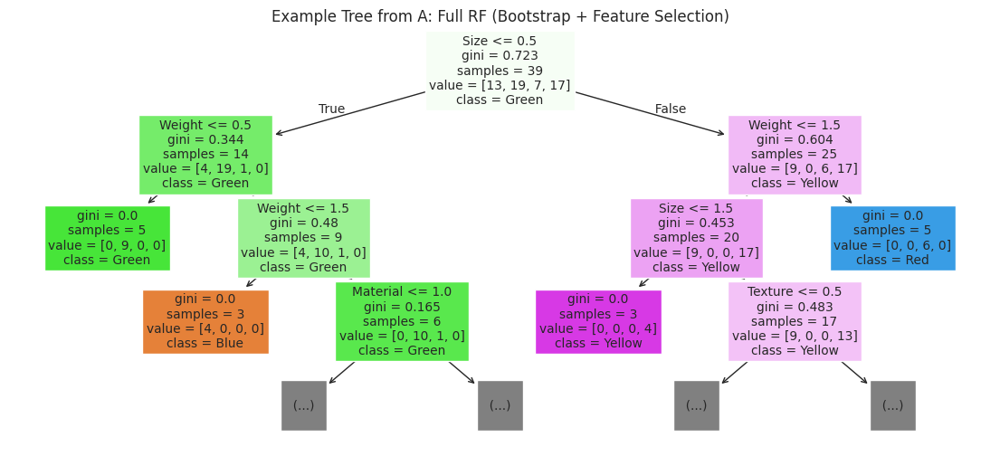

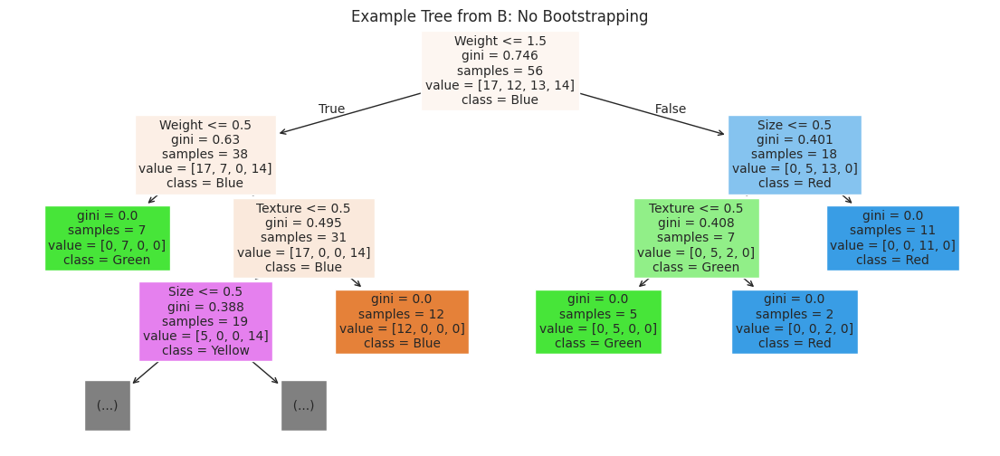

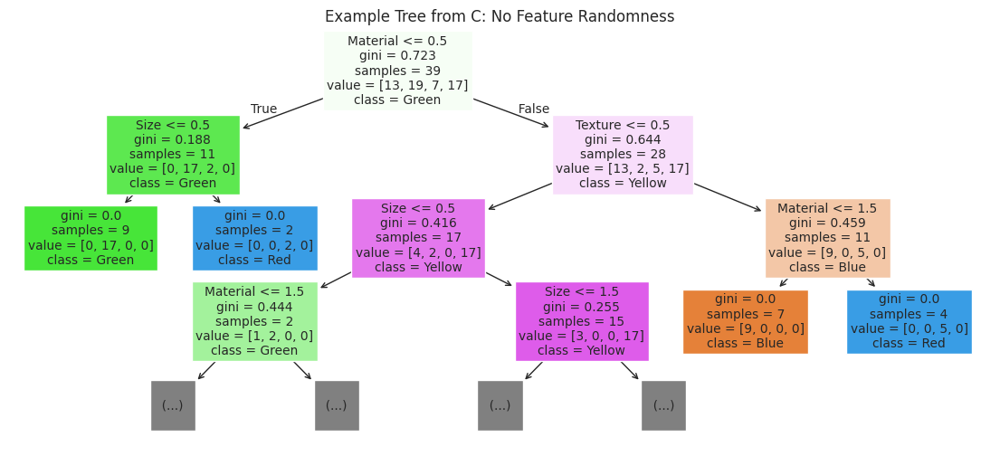

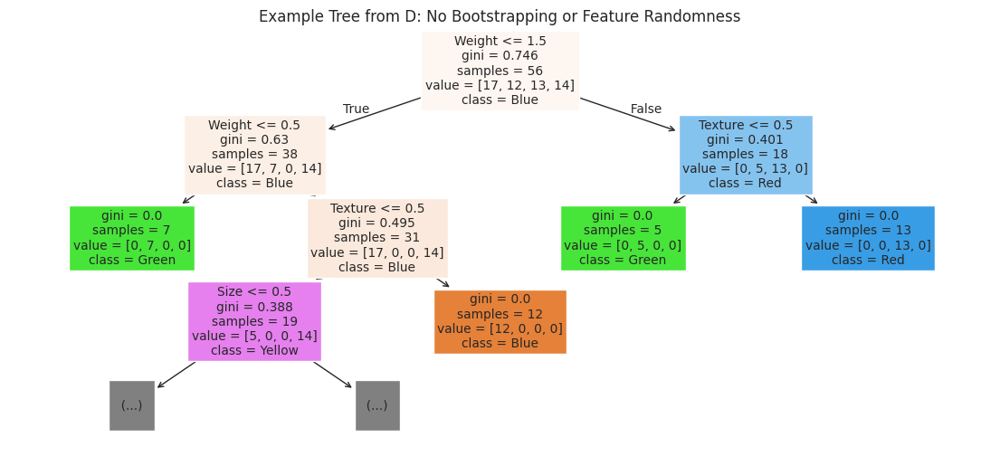

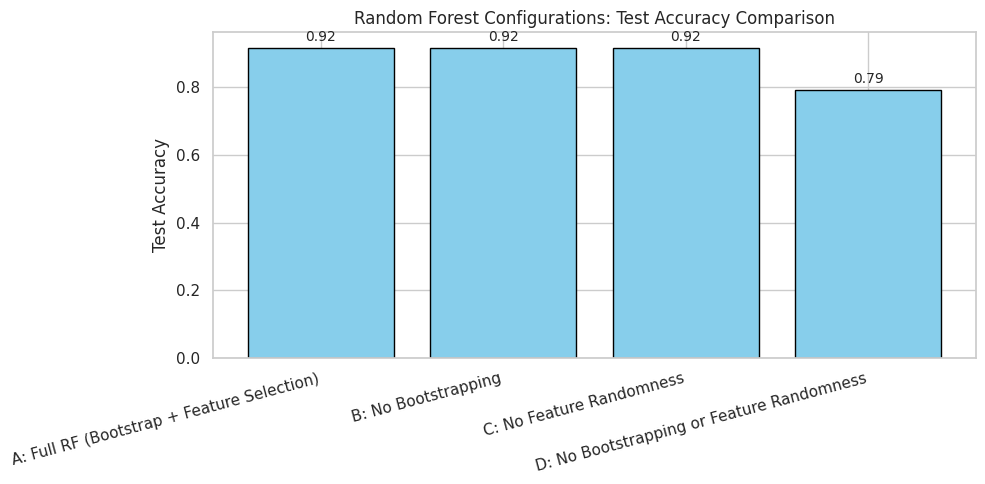

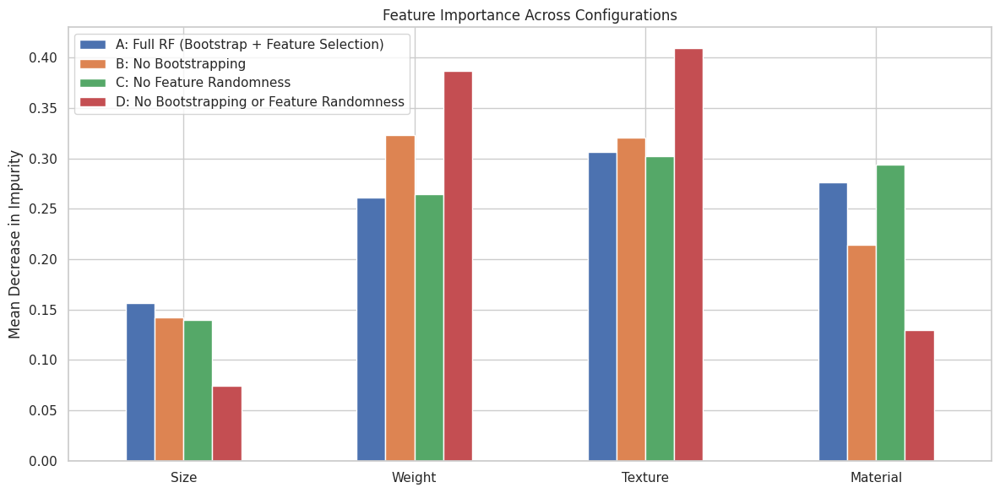

,Configuration,Train Accuracy,Test Accuracy
0,A: Full RF (Bootstrap + Feature Selection),0.946429,0.916667
1,B: No Bootstrapping,0.946429,0.916667
2,C: No Feature Randomness,0.946429,0.916667
3,D: No Bootstrapping or Feature Randomness,0.946429,0.791667


In [ ]:
# Random Forest: Bootstrapping vs Feature Randomness Explained

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# 1. Generate signal-based synthetic dataset of colored balls
def generate_color_group(color, size, weight, texture, material, n=20):
    return {
        "Color": [color] * n,
        "Size": np.random.choice([size]*3 + [np.random.choice(["Small", "Medium", "Large"])], n),
        "Weight": np.random.choice([weight]*3 + [np.random.choice(["Light", "Medium", "Heavy"])], n),
        "Texture": np.random.choice([texture]*3 + [np.random.choice(["Smooth", "Rough"])], n),
        "Material": np.random.choice([material]*3 + [np.random.choice(["Plastic", "Metal", "Rubber"])], n),
    }

np.random.seed(42)
groups = [
    generate_color_group("Blue", "Small", "Light", "Smooth", "Plastic"),
    generate_color_group("Green", "Large", "Heavy", "Rough", "Metal"),
    generate_color_group("Red", "Medium", "Medium", "Smooth", "Rubber"),
    generate_color_group("Yellow", "Small", "Light", "Rough", "Plastic")
]

df = pd.concat([pd.DataFrame(g) for g in groups], ignore_index=True)

# 2. Encode categorical variables
encoded_df = df.copy()
label_encoders = {}
for col in encoded_df.columns:
    if col != "Color":
        le = LabelEncoder()
        encoded_df[col] = le.fit_transform(encoded_df[col])
        label_encoders[col] = le

label_target = LabelEncoder()
encoded_df["Color"] = label_target.fit_transform(encoded_df["Color"])

# 3. Split the dataset
X = encoded_df.drop(columns=["Color"])
y = encoded_df["Color"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# 4. Compare 4 configurations of Random Forest
configs = {
    "A: Full RF (Bootstrap + Feature Selection)": {"bootstrap": True, "max_features": "sqrt"},
    "B: No Bootstrapping": {"bootstrap": False, "max_features": "sqrt"},
    "C: No Feature Randomness": {"bootstrap": True, "max_features": None},
    "D: No Bootstrapping or Feature Randomness": {"bootstrap": False, "max_features": None},
}

results = []
feature_importances = []

for i, (name, params) in enumerate(configs.items()):
    clf = RandomForestClassifier(
        n_estimators=50,
        max_depth=5,
        bootstrap=params["bootstrap"],
        max_features=params["max_features"],
        random_state=1
    )
    clf.fit(X_train, y_train)
    results.append({
        "Configuration": name,
        "Train Accuracy": clf.score(X_train, y_train),
        "Test Accuracy": clf.score(X_test, y_test)
    })

    # Store a plot of the first tree in the forest
    plt.figure(figsize=(14, 6))
    plot_tree(clf.estimators_[0], feature_names=X.columns, class_names=label_target.classes_, filled=True, max_depth=3)
    plt.title(f"Example Tree from {name}")
    plt.show()

    # Store mean feature importance
    feature_importances.append(pd.Series(clf.feature_importances_, index=X.columns, name=name))

# 5. Plot the results
results_df = pd.DataFrame(results)
results_df.sort_values("Test Accuracy", ascending=False, inplace=True)

plt.figure(figsize=(10, 5))
bars = plt.bar(results_df["Configuration"], results_df["Test Accuracy"], color="skyblue", edgecolor="black")
plt.ylabel("Test Accuracy")
plt.title("Random Forest Configurations: Test Accuracy Comparison")
plt.xticks(rotation=15, ha='right')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2f}", ha='center', fontsize=10)
plt.tight_layout()
plt.show()

# Display feature importance comparison
feature_importance_df = pd.concat(feature_importances, axis=1)
feature_importance_df.plot(kind="bar", figsize=(12, 6), title="Feature Importance Across Configurations")
plt.ylabel("Mean Decrease in Impurity")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Display results table
results_df.reset_index(drop=True)


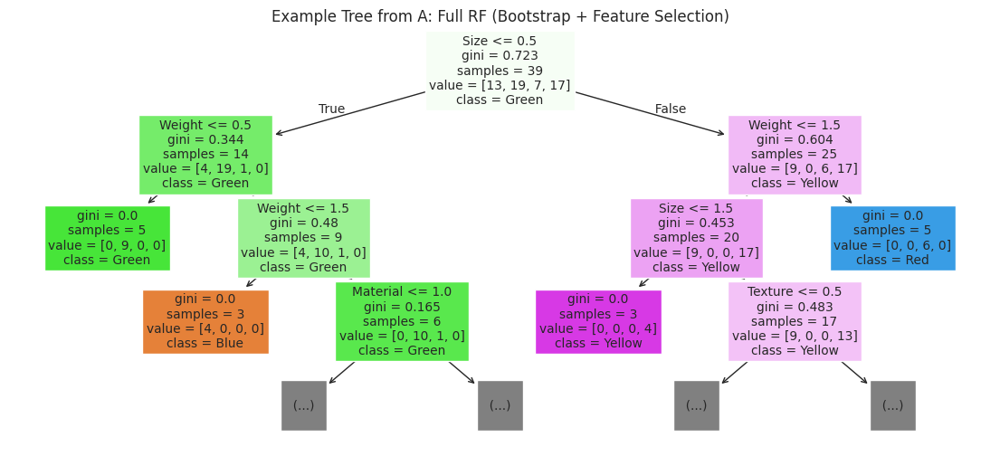

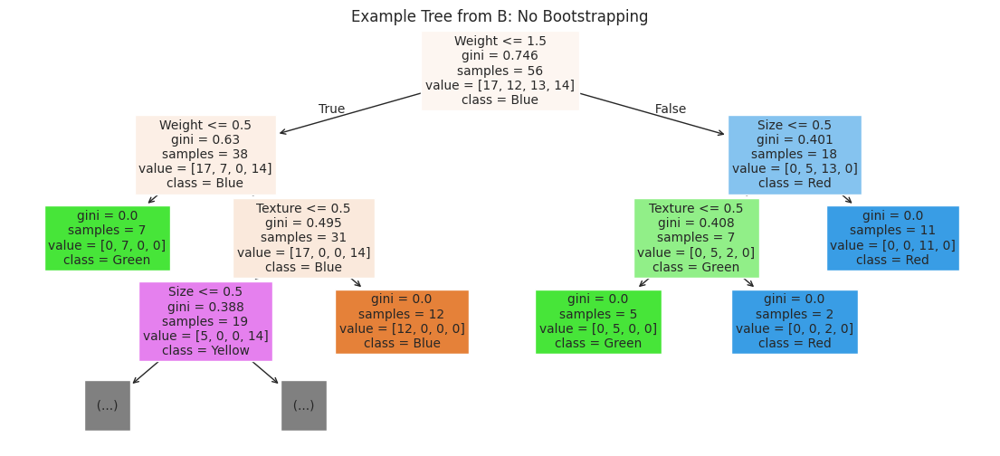

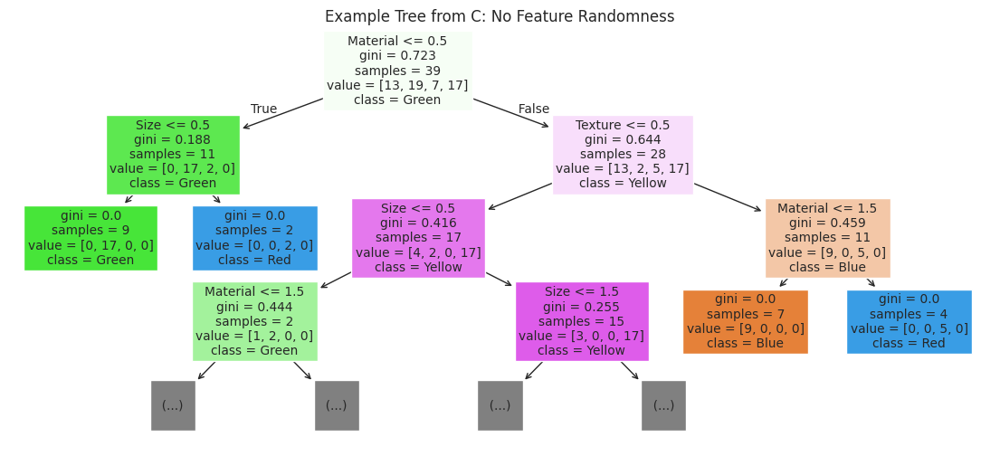

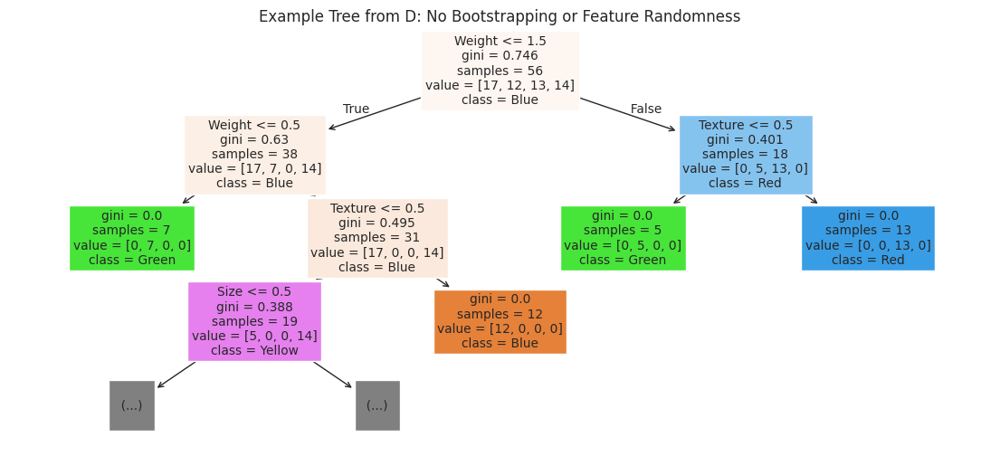

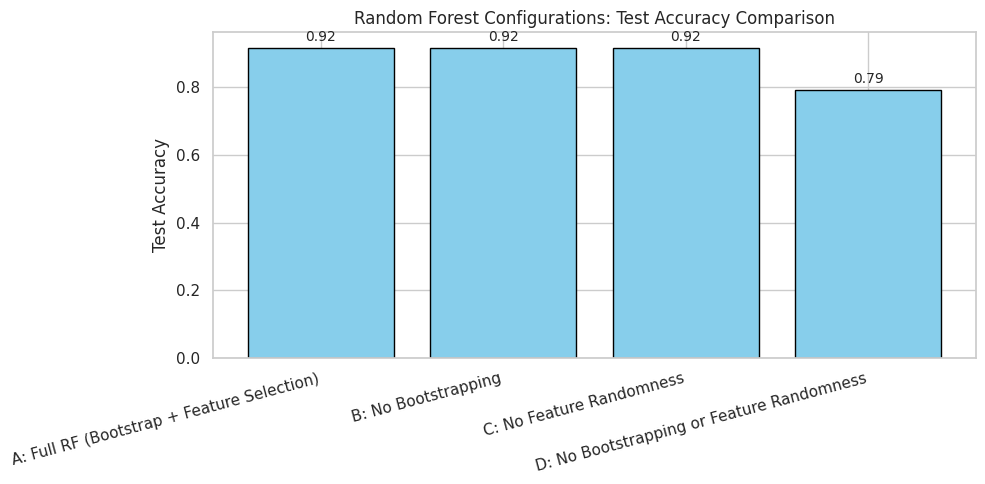

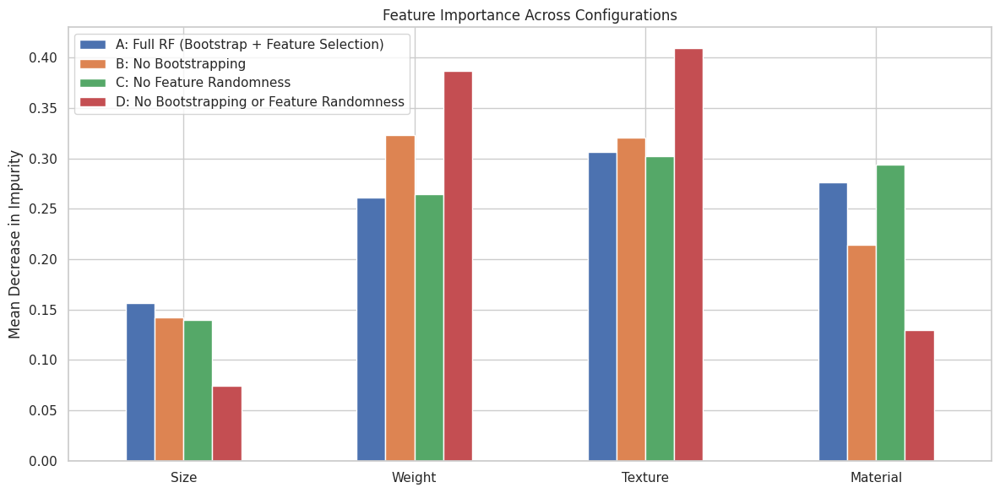

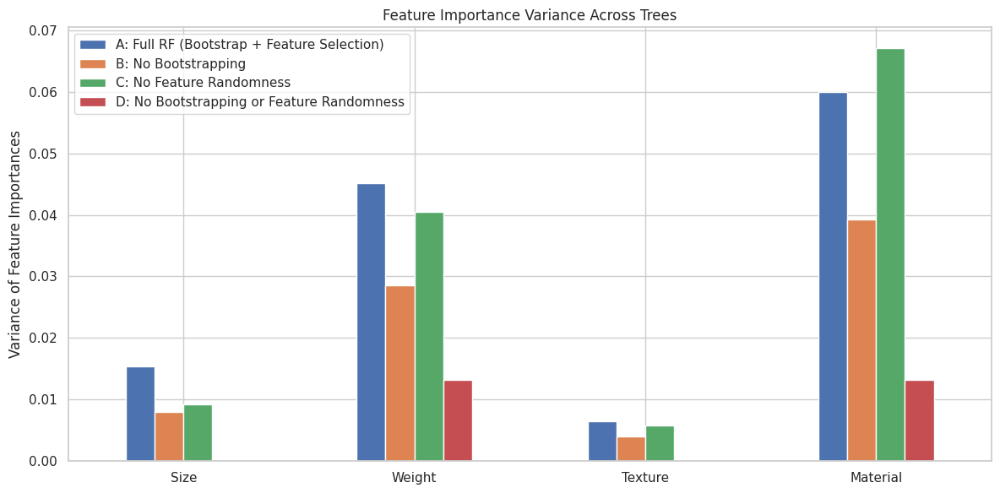

,Configuration,Train Accuracy,Test Accuracy
0,A: Full RF (Bootstrap + Feature Selection),0.946429,0.916667
1,B: No Bootstrapping,0.946429,0.916667
2,C: No Feature Randomness,0.946429,0.916667
3,D: No Bootstrapping or Feature Randomness,0.946429,0.791667


In [102]:
# Random Forest: Bootstrapping vs Feature Randomness Explained

import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# 1. Generate signal-based synthetic dataset of colored balls
def generate_color_group(color, size, weight, texture, material, n=20):
    return {
        "Color": [color] * n,
        "Size": np.random.choice([size]*3 + [np.random.choice(["Small", "Medium", "Large"])], n),
        "Weight": np.random.choice([weight]*3 + [np.random.choice(["Light", "Medium", "Heavy"])], n),
        "Texture": np.random.choice([texture]*3 + [np.random.choice(["Smooth", "Rough"])], n),
        "Material": np.random.choice([material]*3 + [np.random.choice(["Plastic", "Metal", "Rubber"])], n),
    }

np.random.seed(42)
groups = [
    generate_color_group("Blue", "Small", "Light", "Smooth", "Plastic"),
    generate_color_group("Green", "Large", "Heavy", "Rough", "Metal"),
    generate_color_group("Red", "Medium", "Medium", "Smooth", "Rubber"),
    generate_color_group("Yellow", "Small", "Light", "Rough", "Plastic")
]

df = pd.concat([pd.DataFrame(g) for g in groups], ignore_index=True)

# 2. Encode categorical variables
encoded_df = df.copy()
label_encoders = {}
for col in encoded_df.columns:
    if col != "Color":
        le = LabelEncoder()
        encoded_df[col] = le.fit_transform(encoded_df[col])
        label_encoders[col] = le

label_target = LabelEncoder()
encoded_df["Color"] = label_target.fit_transform(encoded_df["Color"])

# 3. Split the dataset
X = encoded_df.drop(columns=["Color"])
y = encoded_df["Color"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

# 4. Compare 4 configurations of Random Forest
configs = {
    "A: Full RF (Bootstrap + Feature Selection)": {"bootstrap": True, "max_features": "sqrt"},
    "B: No Bootstrapping": {"bootstrap": False, "max_features": "sqrt"},
    "C: No Feature Randomness": {"bootstrap": True, "max_features": None},
    "D: No Bootstrapping or Feature Randomness": {"bootstrap": False, "max_features": None},
}

results = []
feature_importances = []
feature_variances = []

for i, (name, params) in enumerate(configs.items()):
    clf = RandomForestClassifier(
        n_estimators=50,
        max_depth=5,
        bootstrap=params["bootstrap"],
        max_features=params["max_features"],
        random_state=1
    )
    clf.fit(X_train, y_train)
    results.append({
        "Configuration": name,
        "Train Accuracy": clf.score(X_train, y_train),
        "Test Accuracy": clf.score(X_test, y_test)
    })

    # Store a plot of the first tree in the forest
    plt.figure(figsize=(14, 6))
    plot_tree(clf.estimators_[0], feature_names=X.columns, class_names=label_target.classes_, filled=True, max_depth=3)
    plt.title(f"Example Tree from {name}")
    plt.show()

    # Store mean feature importance
    mean_importance = pd.Series(clf.feature_importances_, index=X.columns, name=name)
    feature_importances.append(mean_importance)

    # Calculate variance across trees
    all_tree_importances = np.array([tree.feature_importances_ for tree in clf.estimators_])
    feature_variance = pd.Series(np.var(all_tree_importances, axis=0), index=X.columns, name=name)
    feature_variances.append(feature_variance)

# 5. Plot the results
results_df = pd.DataFrame(results)
results_df.sort_values("Test Accuracy", ascending=False, inplace=True)

plt.figure(figsize=(10, 5))
bars = plt.bar(results_df["Configuration"], results_df["Test Accuracy"], color="skyblue", edgecolor="black")
plt.ylabel("Test Accuracy")
plt.title("Random Forest Configurations: Test Accuracy Comparison")
plt.xticks(rotation=15, ha='right')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2f}", ha='center', fontsize=10)
plt.tight_layout()
plt.show()

# Display feature importance comparison
feature_importance_df = pd.concat(feature_importances, axis=1)
feature_importance_df.plot(kind="bar", figsize=(12, 6), title="Feature Importance Across Configurations")
plt.ylabel("Mean Decrease in Impurity")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Display feature importance variance
feature_variance_df = pd.concat(feature_variances, axis=1)
feature_variance_df.plot(kind="bar", figsize=(12, 6), title="Feature Importance Variance Across Trees")
plt.ylabel("Variance of Feature Importances")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Display results table
results_df.reset_index(drop=True)